In [ ]:

#import rasterio
import folium
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


In [ ]:
path = "cleaned_accident_data(OtherColumns removed)2.xlsx"

data = pd.read_excel(path)

In [ ]:

data.head()

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Owner_of_vehicle,Defect_of_vehicle,Lanes_or_Medians,...,Work_of_casuality,Fitness_of_casuality,Accident_severity,Hour,Part_of_day,Type_of_vehicle_standardized,Area_accident_occured_standardized,Vehicle_movement_standardized,Pedestrian_movement_standardized,Cause_of_accident_standardized
0,17:02:00,Monday,18-30,Male,Above High School,Employee,1-2yr,Owner,No defect,Unknown,...,NaN,NaN,Slight Injury,17,Evening,Car,Residential,Straight,Not a Pedestrian,Reversing
1,17:02:00,Monday,31-50,Male,Junior High School,Employee,Above 10yr,Owner,No defect,Undivided Two way,...,NaN,NaN,Slight Injury,17,Evening,Public Transport,Commercial,Straight,Not a Pedestrian,Overtaking
2,17:02:00,Monday,18-30,Male,Junior High School,Employee,1-2yr,Owner,No defect,other,...,Driver,NaN,Serious Injury,17,Evening,Lorry,Recreational,Straight,Not a Pedestrian,Changing Lanes
3,01:06:00,Sunday,18-30,Male,Junior High School,Employee,5-10yr,Governmental,No defect,other,...,Driver,Normal,Slight Injury,1,Night,Public Transport,Commercial,Straight,Not a Pedestrian,Changing Lanes
4,01:06:00,Sunday,18-30,Male,Junior High School,Employee,2-5yr,Owner,No defect,other,...,NaN,NaN,Slight Injury,1,Night,Unknown,Industrial,Straight,Not a Pedestrian,Overtaking


In [ ]:
# Remove the 'Time' column
data = data.drop('Time', axis=1)

# Verify the removal
print("\nColumns after removing 'Time':")
print(data.columns)



Columns after removing 'Time':
Index(['Day_of_week', 'Age_band_of_driver', 'Sex_of_driver',
       'Educational_level', 'Vehicle_driver_relation', 'Driving_experience',
       'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians',
       'Road_allignment', 'Types_of_Junction', 'Road_surface_type',
       'Road_surface_conditions', 'Light_conditions', 'Weather_conditions',
       'Type_of_collision', 'Number_of_vehicles_involved',
       'Number_of_casualties', 'Casualty_class', 'Sex_of_casualty',
       'Age_band_of_casualty', 'Casualty_severity', 'Work_of_casuality',
       'Fitness_of_casuality', 'Accident_severity', 'Hour', 'Part_of_day',
       'Type_of_vehicle_standardized', 'Area_accident_occured_standardized',
       'Vehicle_movement_standardized', 'Pedestrian_movement_standardized',
       'Cause_of_accident_standardized'],
      dtype='object')


In [ ]:
# Check for missing values
missing_values = data.isnull().sum()
print("\nMissing Values in Each Column:")
print(missing_values)




Missing Values in Each Column:
Day_of_week                              0
Age_band_of_driver                       0
Sex_of_driver                            0
Educational_level                        0
Vehicle_driver_relation                  0
Driving_experience                       0
Owner_of_vehicle                         0
Defect_of_vehicle                        0
Lanes_or_Medians                         0
Road_allignment                          0
Types_of_Junction                        0
Road_surface_type                        0
Road_surface_conditions                  0
Light_conditions                         0
Weather_conditions                       0
Type_of_collision                      155
Number_of_vehicles_involved              0
Number_of_casualties                     0
Casualty_class                           0
Sex_of_casualty                          0
Age_band_of_casualty                     0
Casualty_severity                        0
Work_of_casuality     

In [ ]:
# Check missing values in 'Casualty_class'
casualty_class_missing = data['Casualty_class'].isnull().sum()
print(f"Missing values in 'Casualty_class': {casualty_class_missing}")

# Display unique values in 'Casualty_class'
print("\nUnique values in 'Casualty_class':")
print(data['Casualty_class'].unique())


Missing values in 'Casualty_class': 0

Unique values in 'Casualty_class':
['na' 'Driver or rider' 'Pedestrian' 'Passenger']


In [ ]:
# Replace missing values in 'Type_of_collision' with 'unknown'
data['Type_of_collision'] = data['Type_of_collision'].fillna('unknown')

# Verify the replacement
missing_after = data['Type_of_collision'].isnull().sum()
print(f"\nMissing values in 'Type_of_collision' after replacement: {missing_after}")



Missing values in 'Type_of_collision' after replacement: 0


In [ ]:
# Function to handle 'Work_of_casuality' based on 'Casualty_class'
def handle_work_of_casuality(row):
    if pd.isnull(row['Casualty_class']):
        return 'na'
    elif pd.isnull(row['Work_of_casuality']):
        return 'unknown'
    else:
        return row['Work_of_casuality']

# Apply the function to 'Work_of_casuality'
data['Work_of_casuality'] = data.apply(handle_work_of_casuality, axis=1)

# Function to handle 'Fitness_of_casuality' based on 'Casualty_class'
def handle_fitness_of_casuality(row):
    if pd.isnull(row['Casualty_class']):
        return 'na'
    elif pd.isnull(row['Fitness_of_casuality']):
        return 'unknown'
    else:
        return row['Fitness_of_casuality']

# Apply the function to 'Fitness_of_casuality'
data['Fitness_of_casuality'] = data.apply(handle_fitness_of_casuality, axis=1)

# Verify the replacements
work_missing_after = data['Work_of_casuality'].isnull().sum()
fitness_missing_after = data['Fitness_of_casuality'].isnull().sum()
print(f"\nMissing values in 'Work_of_casuality' after replacement: {work_missing_after}")
print(f"Missing values in 'Fitness_of_casuality' after replacement: {fitness_missing_after}")



Missing values in 'Work_of_casuality' after replacement: 0
Missing values in 'Fitness_of_casuality' after replacement: 0


In [ ]:
print("All Columns in the Dataset:")
print(data.columns.tolist())


All Columns in the Dataset:
['Day_of_week', 'Age_band_of_driver', 'Sex_of_driver', 'Educational_level', 'Vehicle_driver_relation', 'Driving_experience', 'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians', 'Road_allignment', 'Types_of_Junction', 'Road_surface_type', 'Road_surface_conditions', 'Light_conditions', 'Weather_conditions', 'Type_of_collision', 'Number_of_vehicles_involved', 'Number_of_casualties', 'Casualty_class', 'Sex_of_casualty', 'Age_band_of_casualty', 'Casualty_severity', 'Work_of_casuality', 'Fitness_of_casuality', 'Accident_severity', 'Hour', 'Part_of_day', 'Type_of_vehicle_standardized', 'Area_accident_occured_standardized', 'Vehicle_movement_standardized', 'Pedestrian_movement_standardized', 'Cause_of_accident_standardized']


In [ ]:
def display_unique_values(df):
    for column in df.columns:
        print(f"---\nColumn: '{column}'")
        unique_vals = df[column].value_counts(dropna=False)
        print(unique_vals)
        print("\n")


In [ ]:
# Display unique values for each column
display_unique_values(data)


---
Column: 'Day_of_week'
Day_of_week
Friday       2041
Thursday     1851
Wednesday    1840
Tuesday      1770
Monday       1681
Saturday     1666
Sunday       1467
Name: count, dtype: int64


---
Column: 'Age_band_of_driver'
Age_band_of_driver
18-30       4271
31-50       4087
Over 51     1585
Unknown     1548
Under 18     825
Name: count, dtype: int64


---
Column: 'Sex_of_driver'
Sex_of_driver
Male       11437
Female       701
Unknown      178
Name: count, dtype: int64


---
Column: 'Educational_level'
Educational_level
Junior High School    7619
Elementary School     2163
High School           1110
Unknown                841
Above High School      362
Illiterate             221
Name: count, dtype: int64


---
Column: 'Vehicle_driver_relation'
Vehicle_driver_relation
Employee    9627
Owner       1973
Unknown      593
Other        123
Name: count, dtype: int64


---
Column: 'Driving_experience'
Driving_experience
5-10yr        3363
2-5yr         2613
Above 10yr    2262
1-2yr         1

In [ ]:
import pandas as pd

# Define the ordinal mappings
ordinal_mappings = {
    'Age_band_of_driver': {
        'Under 18': 0,
        '18-30': 1,
        '31-50': 2,
        'Over 51': 3,
        'Unknown': -1
    },
    'Driving_experience': {
        'No Licence': 0,
        'Below 1yr': 1,
        '1-2yr': 2,
        '2-5yr': 3,
        '5-10yr': 4,
        'Above 10yr': 5,
        'Unknown': -1,
        'unknown': -1  # If 'unknown' is distinct
    },
    'Educational_level': {
        'Illiterate': 0,
        'Junior High School': 1,
        'Elementary School': 2,
        'High School': 3,
        'Above High School': 4,
        'Unknown': -1
    },
    'Age_band_of_casualty': {
        'Under 18': 0,
        '18-30': 1,
        '31-50': 2,
        'Over 51': 3,
        '5': 4,
        'na': -1
    },
    'Casualty_severity': {
        '1': 1,
        '2': 2,
        '3': 3,
        'na': -1
    },
    'Accident_severity': {
        'Slight Injury': 1,
        'Serious Injury': 2,
        'Fatal injury': 3
    }
}

# Apply the mappings
for feature, mapping in ordinal_mappings.items():
    data[feature] = data[feature].map(mapping)


In [ ]:
# Display all column names in the DataFrame
print("\nColumns in the DataFrame:")
print(data.columns.tolist())



Columns in the DataFrame:
['Day_of_week', 'Age_band_of_driver', 'Sex_of_driver', 'Educational_level', 'Vehicle_driver_relation', 'Driving_experience', 'Owner_of_vehicle', 'Defect_of_vehicle', 'Lanes_or_Medians', 'Road_allignment', 'Types_of_Junction', 'Road_surface_type', 'Road_surface_conditions', 'Light_conditions', 'Weather_conditions', 'Type_of_collision', 'Number_of_vehicles_involved', 'Number_of_casualties', 'Casualty_class', 'Sex_of_casualty', 'Age_band_of_casualty', 'Casualty_severity', 'Work_of_casuality', 'Fitness_of_casuality', 'Accident_severity', 'Hour', 'Part_of_day', 'Type_of_vehicle_standardized', 'Area_accident_occured_standardized', 'Vehicle_movement_standardized', 'Pedestrian_movement_standardized', 'Cause_of_accident_standardized']


In [ ]:
# Convert all string entries to lowercase to ensure consistency
string_columns = data.select_dtypes(include=['object']).columns.tolist()

for col in string_columns:
    data[col] = data[col].str.lower()

# Verify the changes
print("\nUnique values in 'Defect_of_vehicle' after standardization:")
print(data['Defect_of_vehicle'].unique())



Unique values in 'Defect_of_vehicle' after standardization:
['no defect' 'unknown' '7' '5']


In [ ]:
# Define a mapping for defect codes
defect_mapping = {
    'no defect': 'no defect',
    'unknown': 'unknown',
    '5': 'minor defect',
    '7': 'major defect'
}

# Apply the mapping
data['Defect_of_vehicle'] = data['Defect_of_vehicle'].map(defect_mapping)

# Verify the mapping
print("\nMapped 'Defect_of_vehicle' Categories:")
print(data['Defect_of_vehicle'].unique())



Mapped 'Defect_of_vehicle' Categories:
['no defect' 'unknown' 'major defect' 'minor defect']


In [ ]:
import pandas as pd

# Define the ordinal mapping for 'defect_of_vehicle'
defect_mapping = {
    'no defect': 0,
    'minor defect': 1,
    'major defect': 2,
    'unknown': -1
}

# Apply the mapping
data['Defect_of_vehicle'] = data['Defect_of_vehicle'].map(defect_mapping)

# Verify the mapping
print("\nOrdinally Encoded 'defect_of_vehicle' Feature:")
print(data['Defect_of_vehicle'].head())



Ordinally Encoded 'defect_of_vehicle' Feature:
0    0
1    0
2    0
3    0
4    0
Name: Defect_of_vehicle, dtype: int64


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, cohen_kappa_score
import matplotlib.pyplot as plt
from sklearn import tree


In [ ]:

# List of already encoded ordinal features
encoded_ordinal_features = [
    'Age_band_of_driver',
    'Driving_experience',
    'Educational_level',
    'Age_band_of_casualty',
    'Casualty_severity',
    'Defect_of_vehicle'  # Already encoded as ordinal
]

# List of numerical features
numerical_features = [
    'Hour',
    'Number_of_vehicles_involved',
    'Number_of_casualties'
]

# Combine all passthrough features
passthrough_features = encoded_ordinal_features + numerical_features


In [ ]:
# Initialize OneHotEncoder
onehot_encoder = OneHotEncoder(

    sparse_output=False,    # Return a dense array
    handle_unknown='ignore' # Ignore unknown categories during transformation
)


In [ ]:
# Define ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', onehot_encoder, nominal_features)
    ],
    remainder='passthrough'  # Pass through already encoded ordinal and numerical features
)



In [ ]:
# Create the preprocessing pipeline
preprocessing_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)
])




In [ ]:

import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, cohen_kappa_score
import matplotlib.pyplot as plt
from sklearn import tree

# Assuming your DataFrame is named 'data'

# Define the target variable
y = data['Accident_severity']

# Define the feature set by dropping the target variable
X = data.drop('Accident_severity', axis=1)


In [ ]:
# Define Nominal Features
nominal_features = [
    'Day_of_week', 'Part_of_day', 'Sex_of_driver',
    'Vehicle_driver_relation', 'Owner_of_vehicle',
    'Lanes_or_Medians', 'Road_allignment', 'Types_of_Junction',
    'Road_surface_type', 'Road_surface_conditions', 'Light_conditions',
    'Weather_conditions', 'Type_of_collision', 'Casualty_class',
    'Sex_of_casualty', 'Work_of_casuality', 'Fitness_of_casuality',
    'Type_of_vehicle_standardized', 'Area_accident_occured_standardized',
    'Vehicle_movement_standardized', 'Pedestrian_movement_standardized',
    'Cause_of_accident_standardized'
]

# Define Passthrough Features (Already Encoded Ordinal Features + Numerical Features)
passthrough_features = [
    'Age_band_of_driver',
    'Educational_level',
    'Driving_experience',
    'Defect_of_vehicle',
    'Number_of_vehicles_involved',
    'Number_of_casualties',
    'Age_band_of_casualty',
    'Casualty_severity',
    'Hour'
]


In [ ]:
# Define ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('onehot', onehot_encoder, nominal_features)
    ],
    remainder='passthrough'  # Passes through the rest of the features (encoded ordinal and numerical features)
)


In [ ]:

# Create the preprocessing pipeline
preprocessing_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)
])


In [ ]:
# Fit and transform the data
X_encoded = preprocessing_pipeline.fit_transform(X)


In [ ]:
# Retrieve One-Hot Encoded Feature Names
onehot_feature_names = preprocessing_pipeline.named_steps['preprocessor'] \
    .named_transformers_['onehot'] \
    .get_feature_names_out(nominal_features)

# Combine One-Hot Encoded Feature Names with Passthrough Feature Names
all_feature_names = list(onehot_feature_names) + passthrough_features

# Verify the Number of Features
print("\nNumber of One-Hot Encoded Features:", len(onehot_feature_names))  # 124
print("Number of Passthrough Features:", len(passthrough_features))          # 9
print("Total Expected Features:", len(onehot_feature_names) + len(passthrough_features))  # 133
print("Actual Encoded Data Columns:", X_encoded.shape[1])                     # 133

# Check for Mismatch
if len(all_feature_names) != X_encoded.shape[1]:
    print("\nMismatch in feature names and encoded data columns!")
    difference = X_encoded.shape[1] - len(all_feature_names)
    print(f"Difference: {difference} columns")

    # Identify Additional Passthrough Features
    detected_passthrough = [col for col in X.columns if col not in nominal_features]

    print("\nDetected Passthrough Features:")
    print(detected_passthrough)

    # Ensure that detected_passthrough matches expected_passthrough
    if set(detected_passthrough) == set(passthrough_features):
        print("\nAll passthrough features are accounted for.")
    else:
        print("\nSome passthrough features are missing or extra. Adjust 'passthrough_features' accordingly.")
        # Update 'all_feature_names' if necessary
        all_feature_names = list(onehot_feature_names) + passthrough_features
        print("\nUpdated Total Expected Features:", len(all_feature_names))
        print("Actual Encoded Data Columns:", X_encoded.shape[1])
        if len(all_feature_names) == X_encoded.shape[1]:
            print("\nFeature names now match the encoded data columns.")
        else:
            print("\nStill a mismatch after updating passthrough features.")
else:
    print("\nFeature names match the encoded data columns.")



Number of One-Hot Encoded Features: 146
Number of Passthrough Features: 9
Total Expected Features: 155
Actual Encoded Data Columns: 155

Feature names match the encoded data columns.


In [ ]:
# Create the DataFrame only if there's a match
if len(all_feature_names) == X_encoded.shape[1]:
    X_encoded_df = pd.DataFrame(X_encoded, columns=all_feature_names)

    # Verify the Encoded DataFrame
    print("\nEncoded DataFrame Snapshot:")
    print(X_encoded_df.head())
    print("\nTotal Features After Encoding:", X_encoded_df.shape[1])
else:
    print("\nCannot create DataFrame due to mismatch in feature names and data columns.")
    print(f"Expected number of columns: {len(all_feature_names)}, Actual number of columns: {X_encoded.shape[1]}")



Encoded DataFrame Snapshot:
   Day_of_week_friday  Day_of_week_monday  Day_of_week_saturday  \
0                 0.0                 1.0                   0.0   
1                 0.0                 1.0                   0.0   
2                 0.0                 1.0                   0.0   
3                 0.0                 0.0                   0.0   
4                 0.0                 0.0                   0.0   

   Day_of_week_sunday  Day_of_week_thursday  Day_of_week_tuesday  \
0                 0.0                   0.0                  0.0   
1                 0.0                   0.0                  0.0   
2                 0.0                   0.0                  0.0   
3                 1.0                   0.0                  0.0   
4                 1.0                   0.0                  0.0   

   Day_of_week_wednesday  Part_of_day_afternoon  Part_of_day_evening  \
0                    0.0                    0.0                  1.0   
1              

In [ ]:
X_encoded_df.to_excel('X_encoded_df.xlsx', index=False)


In [ ]:
# Check the unique values in the target variable
print("Unique values in 'Accident_severity':")
print(y.unique())


Unique values in 'Accident_severity':
[1 2 3]


In [ ]:
# Create a copy of X_encoded_df to avoid modifying the original DataFrame
final_df = X_encoded_df.copy()
y_encoded = data['Accident_severity']  # Your already encoded target variable
# Add the encoded target variable as a new column
final_df['Accident_severity'] = y_encoded

# Optionally, rename the target column for clarity
# For example, to capitalize it:
# final_df.rename(columns={'Accident_severity': 'Accident_Severity'}, inplace=True)

# Verify the final DataFrame
print("\nFinal DataFrame Snapshot:")
print(final_df.head())
print("\nFinal DataFrame Shape:", final_df.shape)




Final DataFrame Snapshot:
   Day_of_week_friday  Day_of_week_monday  Day_of_week_saturday  \
0                 0.0                 1.0                   0.0   
1                 0.0                 1.0                   0.0   
2                 0.0                 1.0                   0.0   
3                 0.0                 0.0                   0.0   
4                 0.0                 0.0                   0.0   

   Day_of_week_sunday  Day_of_week_thursday  Day_of_week_tuesday  \
0                 0.0                   0.0                  0.0   
1                 0.0                   0.0                  0.0   
2                 0.0                   0.0                  0.0   
3                 1.0                   0.0                  0.0   
4                 1.0                   0.0                  0.0   

   Day_of_week_wednesday  Part_of_day_afternoon  Part_of_day_evening  \
0                    0.0                    0.0                  1.0   
1                

In [ ]:
# Export the final DataFrame to an Excel file
final_df.to_excel('encoded_accident_data_withSeverity.xlsx', index=False)

print("\nFinal DataFrame has been exported to 'encoded_accident_data.xlsx'.")



Final DataFrame has been exported to 'encoded_accident_data.xlsx'.


NOW THAT THE DATA IS CLEANED AND ENCODED NOW WE MOVE ONTO MACHINE LEARNING
FIRSTLY TO PREDICT THE SEVERITY OF AN ACCIDENT


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# For modeling
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc, roc_auc_score, cohen_kappa_score
from sklearn.preprocessing import LabelEncoder
from sklearn.multiclass import OneVsRestClassifier

# For XAI
import shap
import lime
import lime.lime_tabular

# For handling warnings
import warnings
warnings.filterwarnings('ignore')


IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [ ]:
# Load the final_df (assuming it's already loaded as 'final_df')
print("Dataset Shape:", final_df.shape)
print("\nFirst Five Rows:")
print(final_df.head())

print("\nData Types:")
print(final_df.dtypes)

print("\nMissing Values:")
print(final_df.isnull().sum())


Dataset Shape: (12316, 156)

First Five Rows:
   Day_of_week_friday  Day_of_week_monday  Day_of_week_saturday  \
0                 0.0                 1.0                   0.0   
1                 0.0                 1.0                   0.0   
2                 0.0                 1.0                   0.0   
3                 0.0                 0.0                   0.0   
4                 0.0                 0.0                   0.0   

   Day_of_week_sunday  Day_of_week_thursday  Day_of_week_tuesday  \
0                 0.0                   0.0                  0.0   
1                 0.0                   0.0                  0.0   
2                 0.0                   0.0                  0.0   
3                 1.0                   0.0                  0.0   
4                 1.0                   0.0                  0.0   

   Day_of_week_wednesday  Part_of_day_afternoon  Part_of_day_evening  \
0                    0.0                    0.0                  1.0  

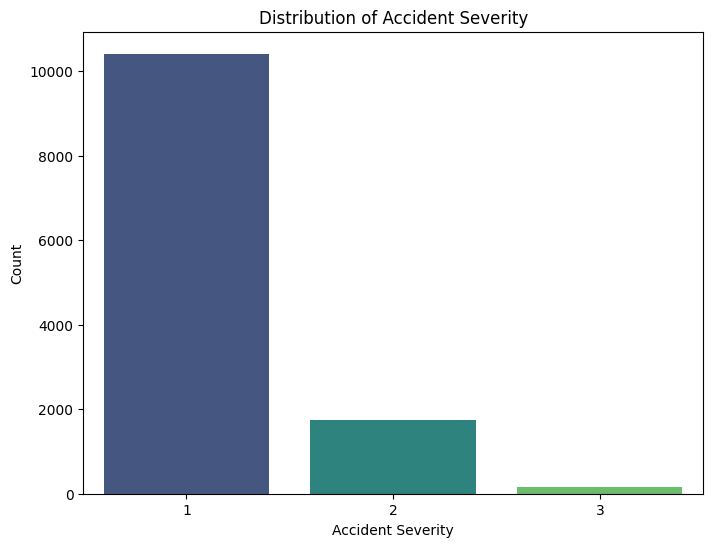


Accident Severity Counts:
 Accident_severity
1    10415
2     1743
3      158
Name: count, dtype: int64

Accident Severity Percentage:
 Accident_severity
1    84.564794
2    14.152322
3     1.282884
Name: proportion, dtype: float64


In [ ]:
# Distribution of Accident Severity
plt.figure(figsize=(8,6))
sns.countplot(x='Accident_severity', data=final_df, palette='viridis')
plt.title('Distribution of Accident Severity')
plt.xlabel('Accident Severity')
plt.ylabel('Count')
plt.show()

# Percentage Distribution
severity_counts = final_df['Accident_severity'].value_counts()
severity_percent = final_df['Accident_severity'].value_counts(normalize=True) * 100
print("\nAccident Severity Counts:\n", severity_counts)
print("\nAccident Severity Percentage:\n", severity_percent)


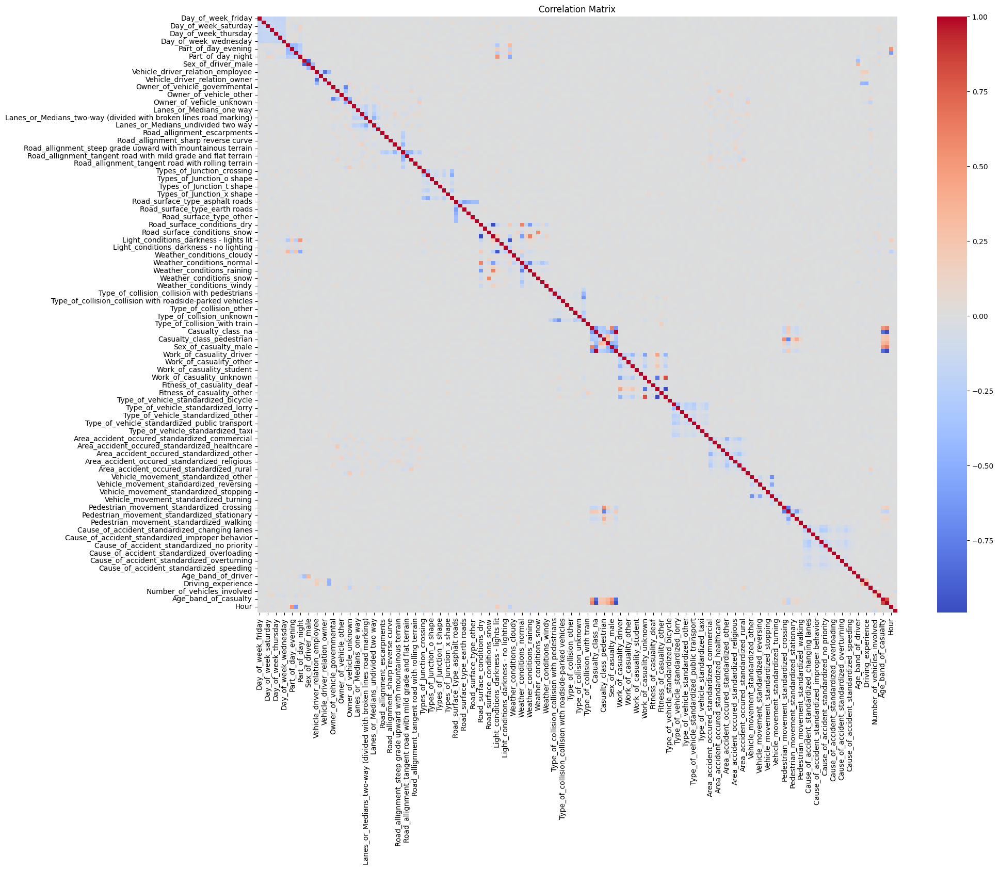


Correlation of Features with Accident Severity:
 Accident_severity                          1.000000
Part_of_day_night                          0.054362
Number_of_casualties                       0.045339
Light_conditions_darkness - no lighting    0.043421
Types_of_Junction_no junction              0.035200
                                             ...   
Weather_conditions_other                  -0.028051
Day_of_week_monday                        -0.030887
Light_conditions_daylight                 -0.033136
Types_of_Junction_crossing                -0.049772
Number_of_vehicles_involved               -0.096023
Name: Accident_severity, Length: 156, dtype: float64


In [ ]:
# Compute correlation matrix
corr_matrix = final_df.corr()

# Heatmap of correlations
plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Correlation with Target Variable
target_corr = corr_matrix['Accident_severity'].sort_values(ascending=False)
print("\nCorrelation of Features with Accident Severity:\n", target_corr)


In [ ]:
# Convert the correlation Series to a DataFrame
target_corr_df = target_corr.reset_index()
target_corr_df.columns = ['Feature', 'Correlation_with_Accident_Severity']

# Display the first few rows to verify
print("\nCorrelation of Features with Accident Severity:")
print(target_corr_df.head())



Correlation of Features with Accident Severity:
                                   Feature  Correlation_with_Accident_Severity
0                        Accident_severity                            1.000000
1                        Part_of_day_night                            0.054362
2                     Number_of_casualties                            0.045339
3  Light_conditions_darkness - no lighting                            0.043421
4            Types_of_Junction_no junction                            0.035200


In [ ]:
# Define the filename
excel_filename = 'EDA_results.xlsx'

# Export to Excel with separate sheets
with pd.ExcelWriter(excel_filename) as writer:
    # Write the correlation table to the first sheet
    target_corr_df.to_excel(writer, sheet_name='Feature_Correlation', index=False)

    # Proceed to add the class distribution in the next step

print(f"\nCorrelation table has been exported to '{excel_filename}' in the 'Feature_Correlation' sheet.")



Correlation table has been exported to 'EDA_results.xlsx' in the 'Feature_Correlation' sheet.


Machine Learning - Predicting the Acciedent Severity

In [ ]:
# Install necessary libraries (if not already installed)
!pip install lazypredict shap lime imbalanced-learn openpyxl


   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   ---------------------------------------- 1.4/1.4 MB 18.8 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc, roc_auc_score, cohen_kappa_score, precision_recall_curve, average_precision_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import lime
import lime.lime_tabular
from sklearn.preprocessing import label_binarize
import joblib
import warnings
warnings.filterwarnings('ignore')


In [ ]:
# Display the first few rows of the DataFrame
print("First Five Rows of the Dataset:")
print(final_df.head())

# Check data types
print("\nData Types:")
print(final_df.dtypes)

# Check for missing values
print("\nMissing Values:")
print(final_df.isnull().sum())


First Five Rows of the Dataset:
   Day_of_week_friday  Day_of_week_monday  Day_of_week_saturday  \
0                0.00                1.00                  0.00   
1                0.00                1.00                  0.00   
2                0.00                1.00                  0.00   
3                0.00                0.00                  0.00   
4                0.00                0.00                  0.00   

   Day_of_week_sunday  Day_of_week_thursday  Day_of_week_tuesday  \
0                0.00                  0.00                 0.00   
1                0.00                  0.00                 0.00   
2                0.00                  0.00                 0.00   
3                1.00                  0.00                 0.00   
4                1.00                  0.00                 0.00   

   Day_of_week_wednesday  Part_of_day_afternoon  Part_of_day_evening  \
0                   0.00                   0.00                 1.00   
1           

In [ ]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the 'Hour' feature
final_df['Hour'] = scaler.fit_transform(final_df[['Hour']])

print("\n'Hour' feature has been scaled using StandardScaler.")



'Hour' feature has been scaled using StandardScaler.


In [ ]:
# Define feature matrix X and target vector y
X = final_df.drop('Accident_severity', axis=1)
y = final_df['Accident_severity']

# Split the data (80% training, 20% testing) with stratification
X_train_lp, X_test_lp, y_train_lp, y_test_lp = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


In [ ]:
# Initialize LazyClassifier
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)

# Fit and predict
models, predictions = clf.fit(X_train_lp, X_test_lp, y_train_lp, y_test_lp)

# Display the results
print("\nLazy Predict Model Performance:")
print(models)


 90%|████████▉ | 26/29 [01:18<00:18,  6.24s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 481
[LightGBM] [Info] Number of data points in the train set: 9852, number of used features: 143
[LightGBM] [Info] Start training from score -0.167691
[LightGBM] [Info] Start training from score -1.955497
[LightGBM] [Info] Start training from score -4.351243


100%|██████████| 29/29 [01:19<00:00,  2.74s/it]


Lazy Predict Model Performance:
                               Accuracy  Balanced Accuracy ROC AUC  F1 Score  \
Model                                                                          
DecisionTreeClassifier             0.76               0.45    None      0.76   
NearestCentroid                    0.50               0.43    None      0.59   
BaggingClassifier                  0.85               0.43    None      0.80   
LGBMClassifier                     0.85               0.39    None      0.80   
QuadraticDiscriminantAnalysis      0.56               0.38    None      0.63   
ExtraTreeClassifier                0.74               0.36    None      0.75   
AdaBoostClassifier                 0.84               0.34    None      0.78   
PassiveAggressiveClassifier        0.79               0.34    None      0.76   
LinearDiscriminantAnalysis         0.84               0.34    None      0.77   
BernoulliNB                        0.84               0.34    None      0.77   
RandomF

Now Training the Classifier tree and the logistic regression

In [ ]:
# Define feature matrix X and target vector y
X = final_df.drop('Accident_severity', axis=1)
y = final_df['Accident_severity']

# Split the data (80% training, 20% testing) with stratification
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print("\nTraining Set Shape:", X_train.shape, y_train.shape)
print("Testing Set Shape:", X_test.shape, y_test.shape)



Training Set Shape: (9852, 155) (9852,)
Testing Set Shape: (2464, 155) (2464,)


In [ ]:
# Initialize the Decision Tree Classifier with class_weight='balanced'
dt_classifier = DecisionTreeClassifier(random_state=42, class_weight='balanced')

# Train the model
dt_classifier.fit(X_train, y_train)

print("\nDecision Tree Classifier has been trained.")



Decision Tree Classifier has been trained.


In [ ]:
# Initialize the Logistic Regression model with class_weight='balanced'
log_reg = LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced')

# Train the model
log_reg.fit(X_train, y_train)

print("Logistic Regression Model has been trained.")


Logistic Regression Model has been trained.


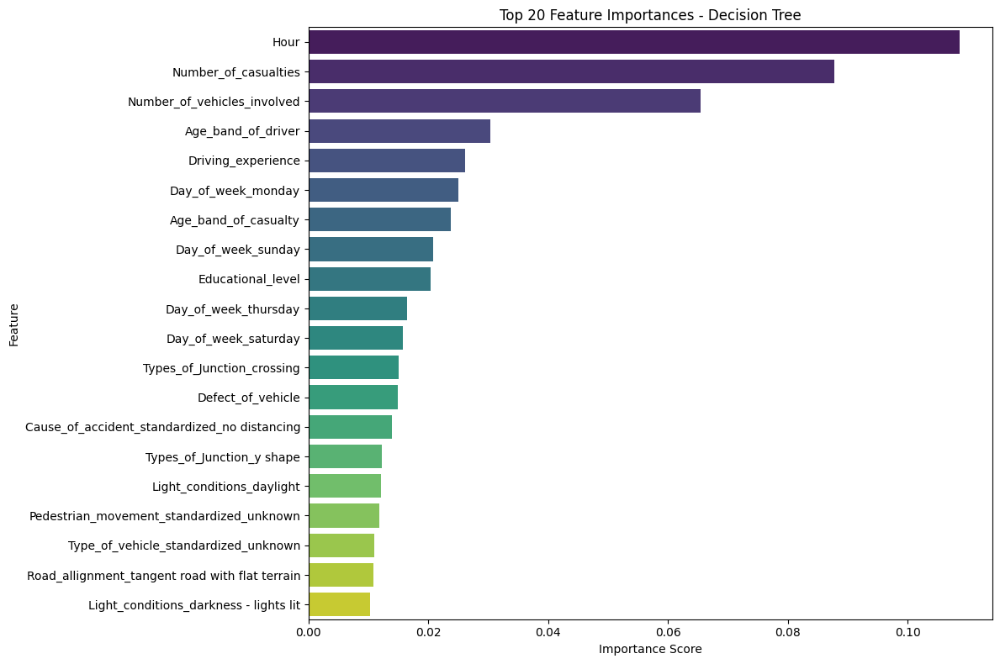

In [ ]:
# Feature Importance from Decision Tree
importances = dt_classifier.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot Top 20 Features
plt.figure(figsize=(12,8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(20), palette='viridis')
plt.title('Top 20 Feature Importances - Decision Tree')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.savefig('Feature_Importances_DT.png')
plt.show()


Now Dropping the HOUR column to reduce skewing

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# For modeling
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report, confusion_matrix, accuracy_score, roc_curve, auc,
    roc_auc_score, cohen_kappa_score, precision_recall_curve, average_precision_score, f1_score
)
from sklearn.preprocessing import StandardScaler, label_binarize

# For XAI
import shap
import lime
import lime.lime_tabular

# For Lazy Predict
from lazypredict.Supervised import LazyClassifier

# For saving models
import joblib

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')


In [ ]:
# Display the first few rows of the DataFrame
print("First Five Rows of the Dataset:")
print(final_df.head())

# Check data types
print("\nData Types:")
print(final_df.dtypes)

# Check for missing values
print("\nMissing Values:")
print(final_df.isnull().sum())


First Five Rows of the Dataset:
   Day_of_week_friday  Day_of_week_monday  Day_of_week_saturday  \
0                0.00                1.00                  0.00   
1                0.00                1.00                  0.00   
2                0.00                1.00                  0.00   
3                0.00                0.00                  0.00   
4                0.00                0.00                  0.00   

   Day_of_week_sunday  Day_of_week_thursday  Day_of_week_tuesday  \
0                0.00                  0.00                 0.00   
1                0.00                  0.00                 0.00   
2                0.00                  0.00                 0.00   
3                1.00                  0.00                 0.00   
4                1.00                  0.00                 0.00   

   Day_of_week_wednesday  Part_of_day_afternoon  Part_of_day_evening  \
0                   0.00                   0.00                 1.00   
1           

In [ ]:
# Drop the 'Hour' column
final_df.drop('Hour', axis=1, inplace=True)

print("\n'Hour' column has been dropped from the dataset.")



'Hour' column has been dropped from the dataset.


In [ ]:
# Verify the 'Hour' column has been dropped
print("\nColumns after dropping 'Hour':")
print(final_df.columns)



Columns after dropping 'Hour':
Index(['Day_of_week_friday', 'Day_of_week_monday', 'Day_of_week_saturday',
       'Day_of_week_sunday', 'Day_of_week_thursday', 'Day_of_week_tuesday',
       'Day_of_week_wednesday', 'Part_of_day_afternoon', 'Part_of_day_evening',
       'Part_of_day_morning',
       ...
       'Cause_of_accident_standardized_unknown', 'Age_band_of_driver',
       'Educational_level', 'Driving_experience', 'Defect_of_vehicle',
       'Number_of_vehicles_involved', 'Number_of_casualties',
       'Age_band_of_casualty', 'Casualty_severity', 'Accident_severity'],
      dtype='object', length=155)


Decison Tree

In [ ]:
# Define feature matrix X and target vector y
X_dt = final_df.drop('Accident_severity', axis=1)
y_dt = final_df['Accident_severity']

print("\nFeature Matrix Shape (Decision Tree):", X_dt.shape)
print("Target Vector Shape (Decision Tree):", y_dt.shape)



Feature Matrix Shape (Decision Tree): (12316, 154)
Target Vector Shape (Decision Tree): (12316,)


In [ ]:
# Split the data (80% training, 20% testing) with stratification
X_train_dt, X_test_dt, y_train_dt, y_test_dt = train_test_split(
    X_dt, y_dt, test_size=0.2, random_state=42, stratify=y_dt
)

print("\nDecision Tree - Training Set Shape:", X_train_dt.shape, y_train_dt.shape)
print("Decision Tree - Testing Set Shape:", X_test_dt.shape, y_test_dt.shape)



Decision Tree - Training Set Shape: (9852, 154) (9852,)
Decision Tree - Testing Set Shape: (2464, 154) (2464,)


In [ ]:
# Initialize the Decision Tree Classifier with class_weight='balanced'
dt_classifier = DecisionTreeClassifier(random_state=42, class_weight='balanced')

# Train the model
dt_classifier.fit(X_train_dt, y_train_dt)

print("\nDecision Tree Classifier has been trained.")



Decision Tree Classifier has been trained.



Feature Importances (Decision Tree):
                                        Feature  Importance
151                        Number_of_casualties        0.08
150                 Number_of_vehicles_involved        0.06
146                          Age_band_of_driver        0.04
147                           Educational_level        0.03
148                          Driving_experience        0.03
..                                          ...         ...
119  Area_accident_occured_standardized_unknown        0.00
96                    Fitness_of_casuality_deaf        0.00
63               Weather_conditions_fog or mist        0.00
100        Type_of_vehicle_standardized_bicycle        0.00
98                   Fitness_of_casuality_other        0.00

[154 rows x 2 columns]


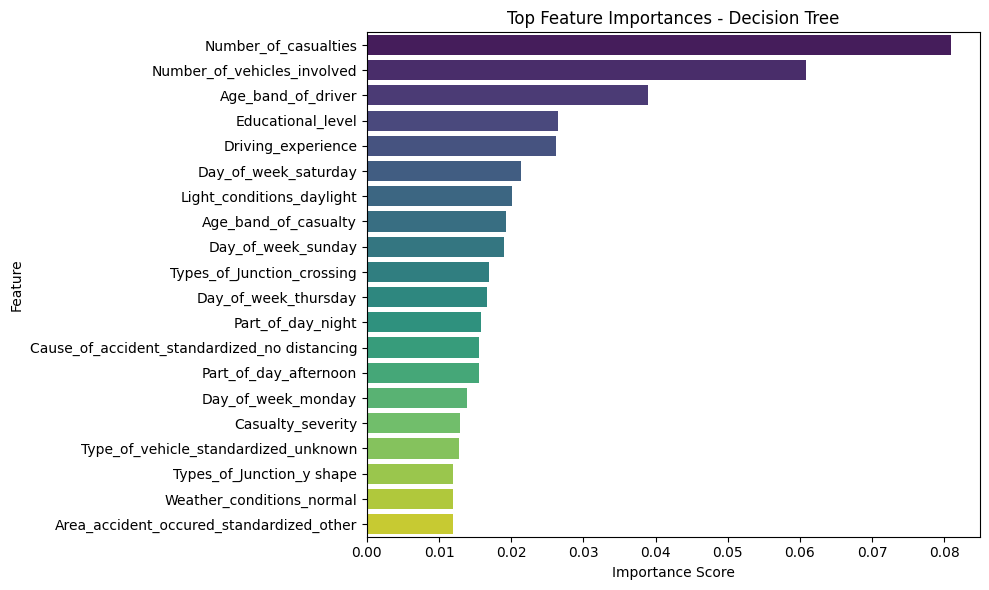

In [ ]:
# Feature Importance from Decision Tree
importances_dt = dt_classifier.feature_importances_
feature_names_dt = X_dt.columns
feature_importance_df_dt = pd.DataFrame({
    'Feature': feature_names_dt,
    'Importance': importances_dt
}).sort_values(by='Importance', ascending=False)

# Display the feature importance DataFrame
print("\nFeature Importances (Decision Tree):")
print(feature_importance_df_dt)

# Plot Top 20 Features (if applicable)
plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df_dt.head(20), palette='viridis')
plt.title('Top Feature Importances - Decision Tree')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.savefig('Feature_Importances_DT.png')
plt.show()


In [ ]:
# Initialize SHAP Explainer for Decision Tree
explainer_dt = shap.TreeExplainer(dt_classifier)

# Calculate SHAP values
shap_values_dt = explainer_dt.shap_values(X_test_dt)


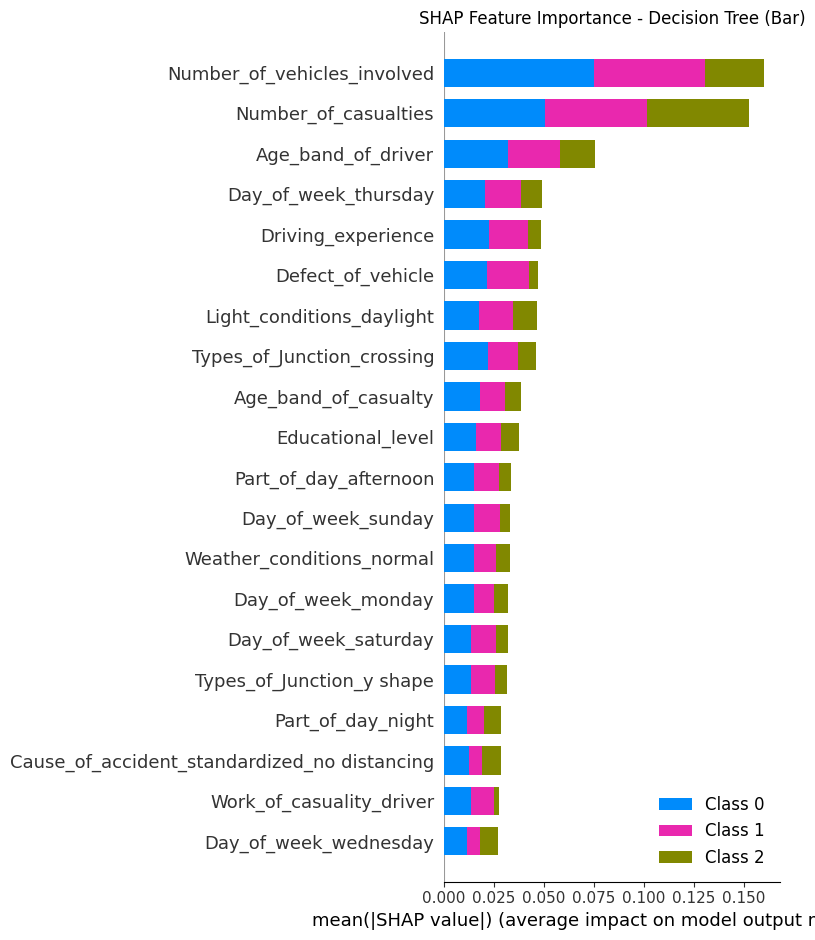

In [ ]:
# SHAP Summary Plot (Bar)
plt.figure(figsize=(12,8))
shap.summary_plot(shap_values_dt, X_test_dt, plot_type="bar", show=False)
plt.title('SHAP Feature Importance - Decision Tree (Bar)')
plt.tight_layout()
plt.savefig('SHAP_Summary_Bar_DT.png')
plt.show()


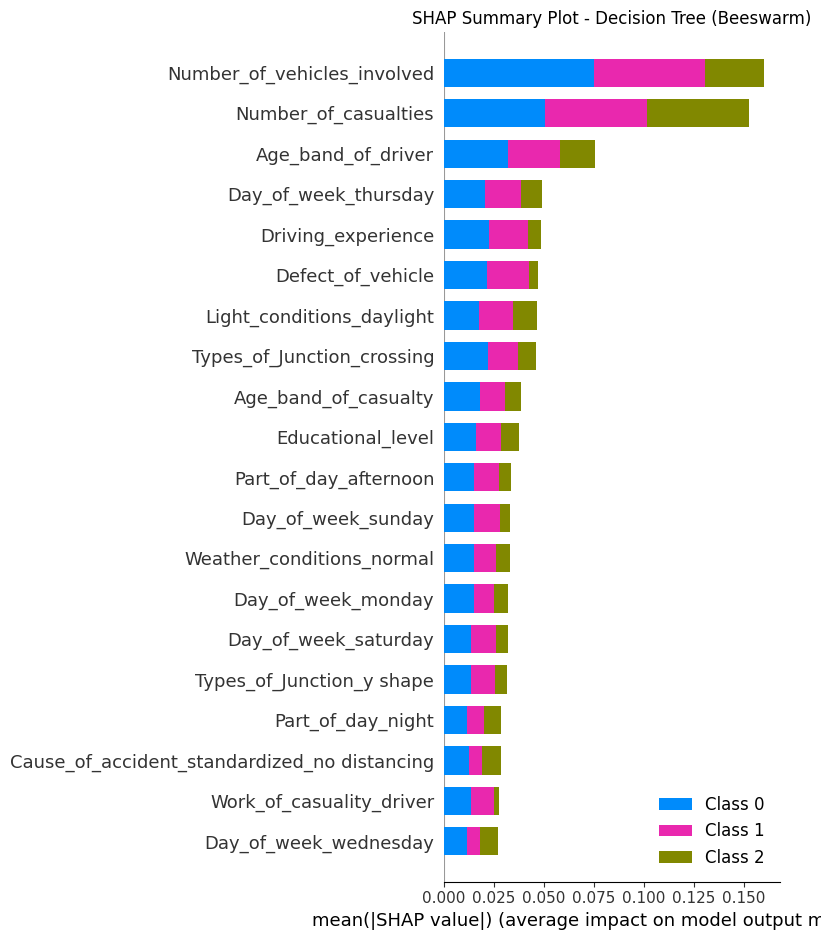

In [ ]:
# SHAP Summary Plot (Beeswarm)
plt.figure(figsize=(12,8))
shap.summary_plot(shap_values_dt, X_test_dt, feature_names=feature_names_dt, show=False)
plt.title('SHAP Summary Plot - Decision Tree (Beeswarm)')
plt.tight_layout()
plt.savefig('SHAP_Summary_Beeswarm_DT.png')
plt.show()


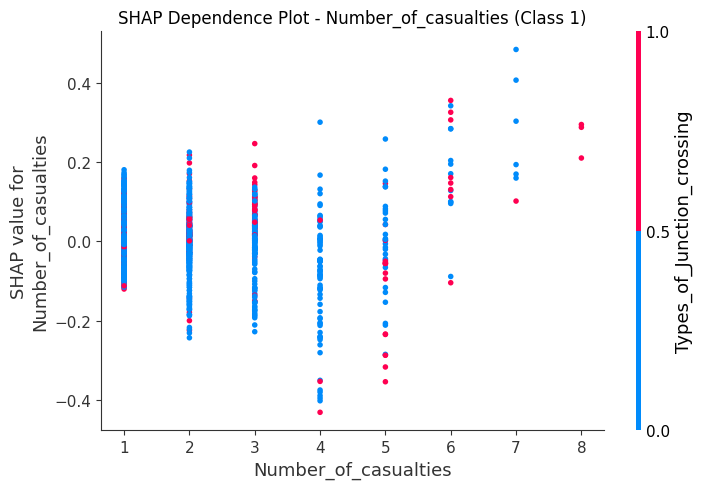

In [ ]:
# SHAP Dependence Plot for 'Number_of_casualties' for Class 1
shap.dependence_plot('Number_of_casualties', shap_values_dt[0], X_test_dt, show=False)
plt.title('SHAP Dependence Plot - Number_of_casualties (Class 1)')
plt.tight_layout()
plt.savefig('SHAP_Dependence_Number_of_casualties_Class1_DT.png')
plt.show()


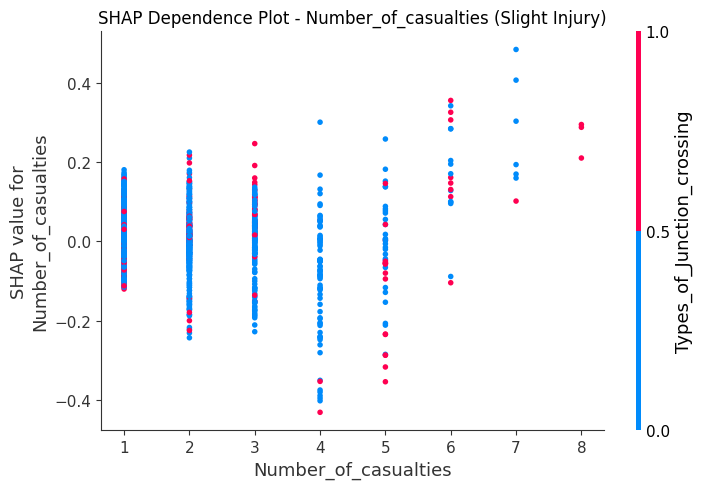

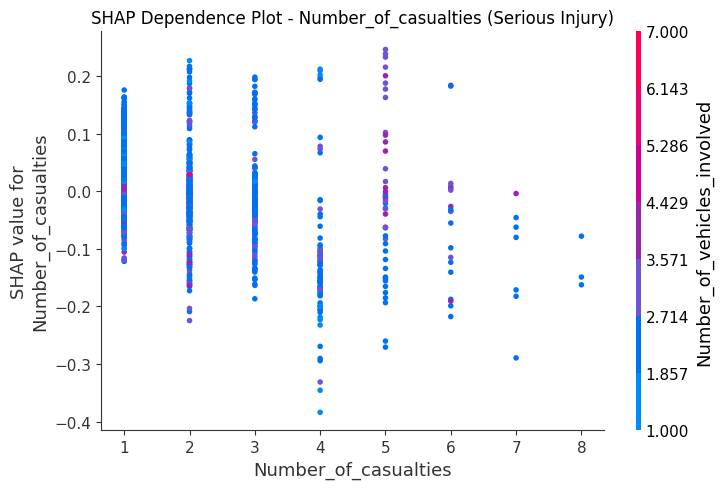

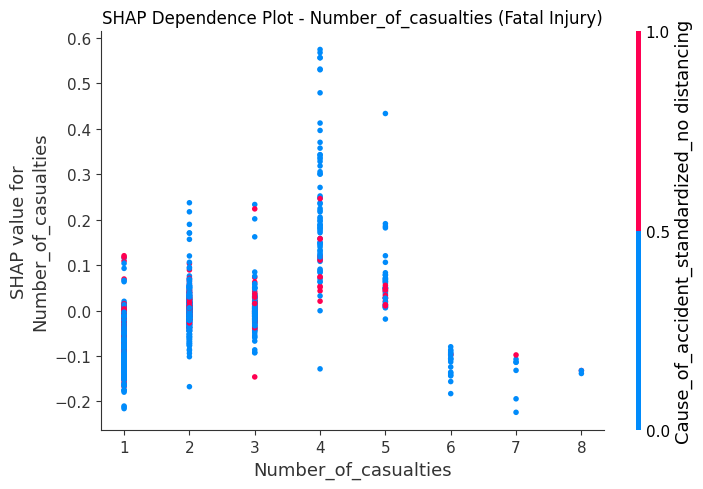

In [ ]:
# Iterate through each class to create SHAP Dependence Plots
for i, class_name in enumerate(['Slight Injury', 'Serious Injury', 'Fatal Injury']):
    shap.dependence_plot('Number_of_casualties', shap_values_dt[i], X_test_dt, show=False)
    plt.title(f'SHAP Dependence Plot - Number_of_casualties ({class_name})')
    plt.tight_layout()
    plt.savefig(f'SHAP_Dependence_Number_of_casualties_{class_name}_DT.png')
    plt.show()


In [ ]:
# Initialize LIME Explainer
lime_explainer_dt = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_dt),
    feature_names=feature_names_dt,
    class_names=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
    mode='classification'
)


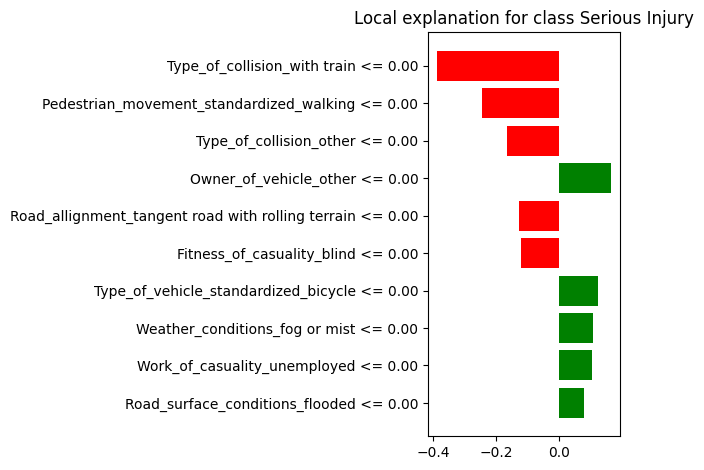

In [ ]:
# Select an instance to explain
i_dt = 10  # Change this index as needed
exp_dt = lime_explainer_dt.explain_instance(
    data_row=X_test_dt.iloc[i_dt],
    predict_fn=dt_classifier.predict_proba,
    num_features=10
)

# Display the explanation in the notebook
exp_dt.show_in_notebook(show_table=True)

# For script-based environments, save the explanation as a figure
fig_dt = exp_dt.as_pyplot_figure()
plt.tight_layout()
plt.savefig('LIME_Explanation_DT_Instance_10.png')
plt.show()


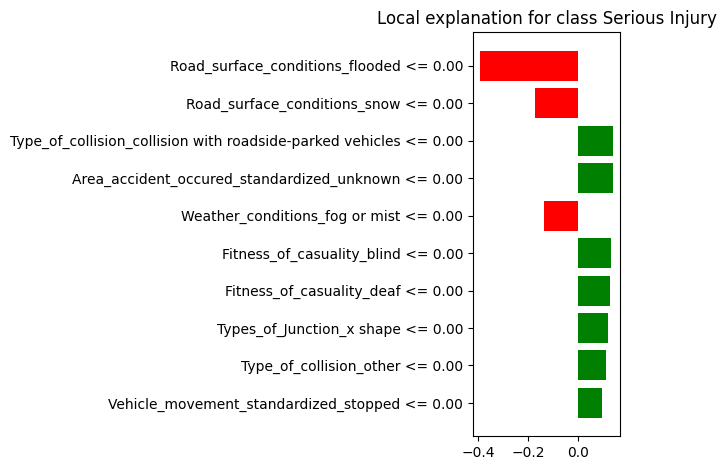

In [ ]:
# Select an instance to explain
i_dt = 70  # Change this index as needed
exp_dt = lime_explainer_dt.explain_instance(
    data_row=X_test_dt.iloc[i_dt],
    predict_fn=dt_classifier.predict_proba,
    num_features=10
)

# Display the explanation in the notebook
exp_dt.show_in_notebook(show_table=True)

# For script-based environments, save the explanation as a figure
fig_dt = exp_dt.as_pyplot_figure()
plt.tight_layout()
plt.savefig('LIME_Explanation_DT_Instance_70.png')
plt.show()


ValueError: target must be specified for multi-class

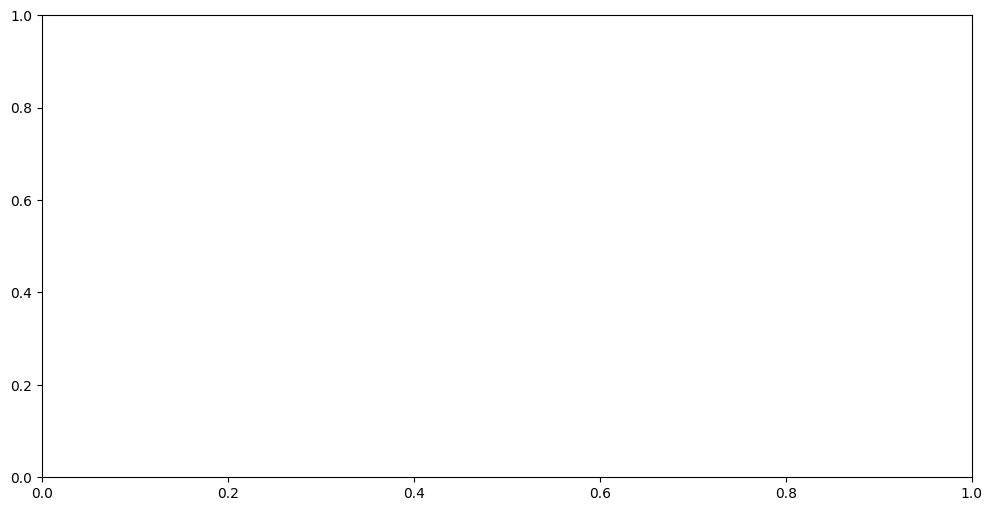

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

# Select features to plot
features_to_plot_dt_pdp = ['Number_of_casualties', 'Driving_experience']

# Plot Partial Dependence Plots for Decision Tree
fig_dt_pdp, ax_dt_pdp = plt.subplots(figsize=(12,6))
PartialDependenceDisplay.from_estimator(
    dt_classifier,
    X_test_dt,
    features=features_to_plot_dt_pdp,
    grid_resolution=20,
    ax=ax_dt_pdp
)
plt.tight_layout()
plt.savefig('Partial_Dependence_Plots_DT.png')
plt.show()


In [ ]:
# Predictions from Decision Tree
y_pred_dt = dt_classifier.predict(X_test_dt)
y_proba_dt = dt_classifier.predict_proba(X_test_dt)


In [ ]:
# Classification Report
print("\nDecision Tree Classifier - Classification Report:")
print(classification_report(y_test_dt, y_pred_dt))



Decision Tree Classifier - Classification Report:
              precision    recall  f1-score   support

           1       0.86      0.83      0.85      2084
           2       0.21      0.25      0.23       349
           3       0.11      0.13      0.12        31

    accuracy                           0.74      2464
   macro avg       0.39      0.40      0.40      2464
weighted avg       0.76      0.74      0.75      2464



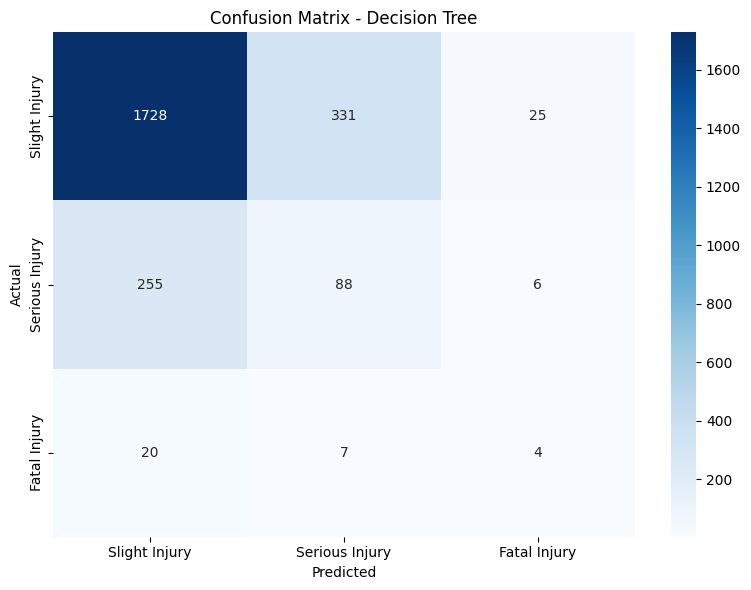

In [ ]:
# Confusion Matrix
cm_dt = confusion_matrix(y_test_dt, y_pred_dt)
plt.figure(figsize=(8,6))
sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
            yticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Decision Tree')
plt.tight_layout()
plt.savefig('Confusion_Matrix_DT.png')
plt.show()


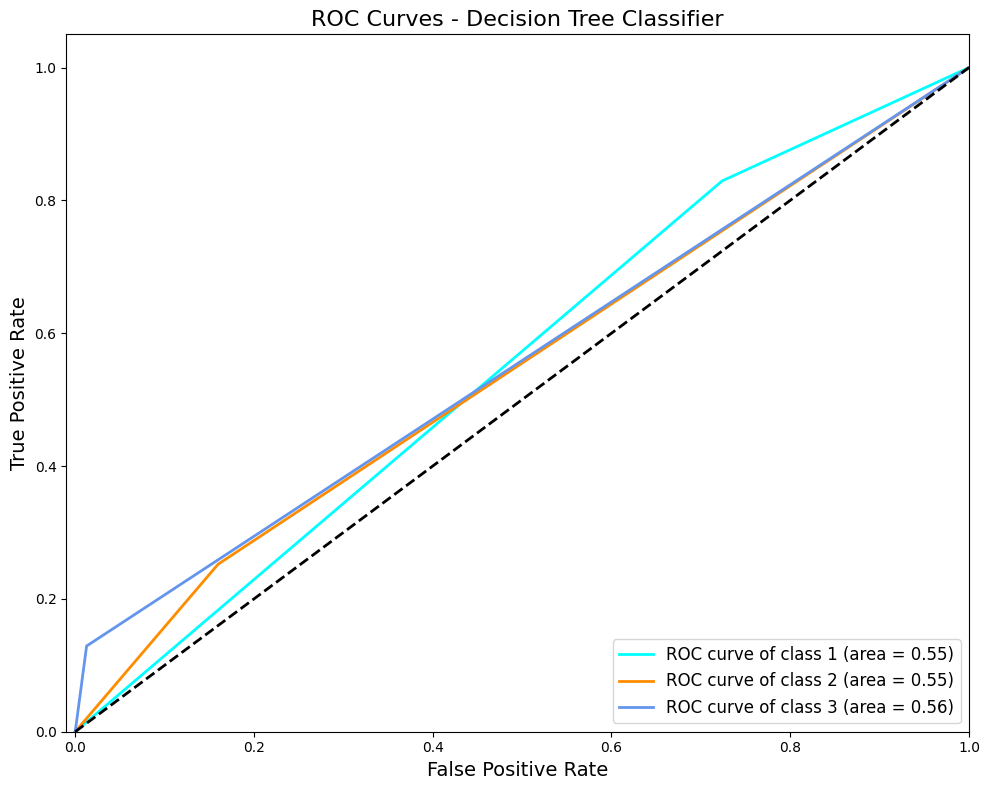

In [ ]:
# Binarize the output for ROC
y_test_binarized_dt = label_binarize(y_test_dt, classes=[1,2,3])
n_classes_dt = y_test_binarized_dt.shape[1]

# Compute ROC curve and ROC area for each class
fpr_dt = dict()
tpr_dt = dict()
roc_auc_dt = dict()

for i in range(n_classes_dt):
    fpr_dt[i], tpr_dt[i], _ = roc_curve(y_test_binarized_dt[:, i], y_proba_dt[:, i])
    roc_auc_dt[i] = auc(fpr_dt[i], tpr_dt[i])

# Compute micro-average ROC curve and ROC area
fpr_dt["micro"], tpr_dt["micro"], _ = roc_curve(y_test_binarized_dt.ravel(), y_proba_dt.ravel())
roc_auc_dt["micro"] = auc(fpr_dt["micro"], tpr_dt["micro"])

# Plot all ROC curves
plt.figure(figsize=(10,8))
colors_dt = ['aqua', 'darkorange', 'cornflowerblue']
for i, color in zip(range(n_classes_dt), colors_dt):
    plt.plot(fpr_dt[i], tpr_dt[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc_dt[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curves - Decision Tree Classifier', fontsize=16)
plt.legend(loc="lower right", fontsize=12)
plt.tight_layout()
plt.savefig('ROC_Curves_DT.png')
plt.show()


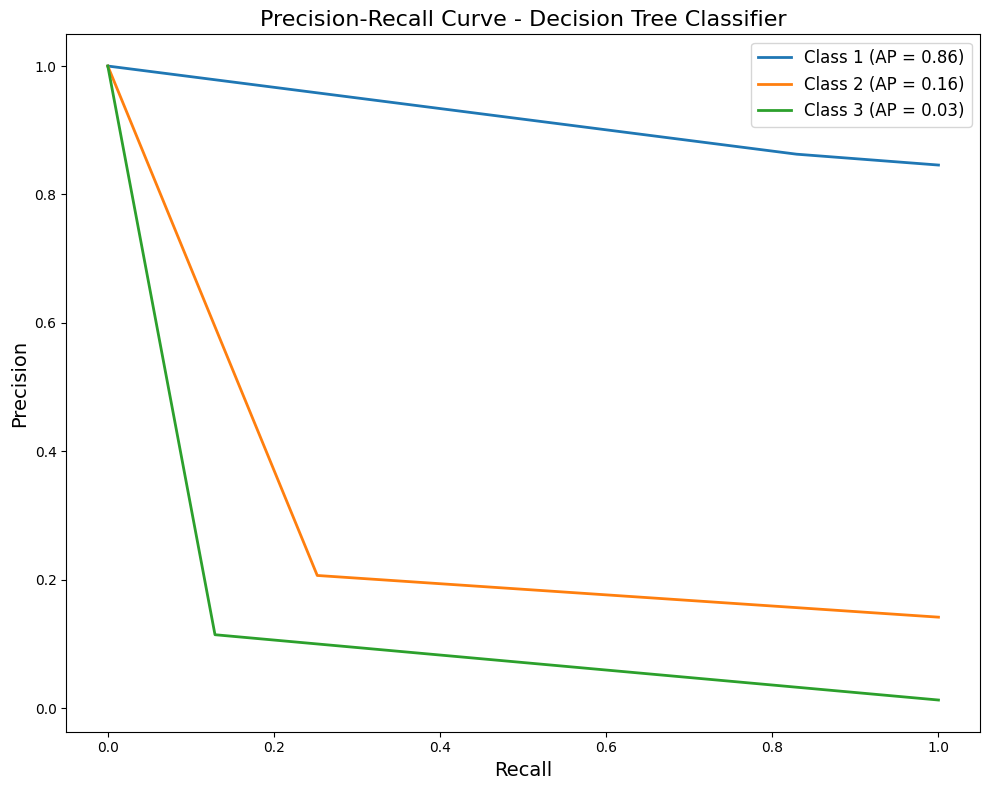

In [ ]:
# Initialize plot
plt.figure(figsize=(10,8))

for i in range(n_classes_dt):
    precision, recall, _ = precision_recall_curve(y_test_binarized_dt[:, i], y_proba_dt[:, i])
    average_precision = average_precision_score(y_test_binarized_dt[:, i], y_proba_dt[:, i])
    plt.plot(recall, precision, lw=2, label='Class {0} (AP = {1:0.2f})'.format(i+1, average_precision))

plt.xlabel('Recall', fontsize=14)
plt.ylabel('Precision', fontsize=14)
plt.title('Precision-Recall Curve - Decision Tree Classifier', fontsize=16)
plt.legend(loc="upper right", fontsize=12)
plt.tight_layout()
plt.savefig('Precision_Recall_Curve_DT.png')
plt.show()


In [ ]:
# Calculate F1-Score for each class
f1_scores_dt = f1_score(y_test_dt, y_pred_dt, average=None)
for i, score in enumerate(f1_scores_dt, 1):
    print(f"F1-Score for Class {i}: {score:.2f}")


F1-Score for Class 1: 0.85
F1-Score for Class 2: 0.23
F1-Score for Class 3: 0.12


In [ ]:
# Cohen's Kappa
kappa_dt = cohen_kappa_score(y_test_dt, y_pred_dt)
print("\nCohen's Kappa (Decision Tree):", kappa_dt)



Cohen's Kappa (Decision Tree): 0.09183905315961616


Now LOGISTIC REGRESSION

In [ ]:
# Define feature matrix X and target vector y for Logistic Regression
X_lr = final_df.drop('Accident_severity', axis=1)
y_lr = final_df['Accident_severity']

print("\nFeature Matrix Shape (Logistic Regression):", X_lr.shape)
print("Target Vector Shape (Logistic Regression):", y_lr.shape)



Feature Matrix Shape (Logistic Regression): (12316, 154)
Target Vector Shape (Logistic Regression): (12316,)


In [ ]:
# Split the data (80% training, 20% testing) with stratification
X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(
    X_lr, y_lr, test_size=0.2, random_state=42, stratify=y_lr
)

print("\nLogistic Regression - Training Set Shape:", X_train_lr.shape, y_train_lr.shape)
print("Logistic Regression - Testing Set Shape:", X_test_lr.shape, y_test_lr.shape)



Logistic Regression - Training Set Shape: (9852, 154) (9852,)
Logistic Regression - Testing Set Shape: (2464, 154) (2464,)


In [ ]:
# Initialize the Logistic Regression model with class_weight='balanced'
log_reg = LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced')

# Train the model
log_reg.fit(X_train_lr, y_train_lr)

print("\nLogistic Regression Model has been trained.")



Logistic Regression Model has been trained.



Top Features for Class Slight Injury:
                                               Feature  Coefficient
100               Type_of_vehicle_standardized_bicycle         1.28
112      Area_accident_occured_standardized_healthcare         1.17
75                Type_of_collision_fall from vehicles         1.14
95                          Fitness_of_casuality_blind         1.06
27   Lanes_or_Medians_two-way (divided with solid l...         0.90
46                           Types_of_Junction_x shape         0.85
130        Pedestrian_movement_standardized_stationary         0.75
92                           Work_of_casuality_student         0.74
127              Vehicle_movement_standardized_unknown         0.73
67                Weather_conditions_raining and windy         0.72


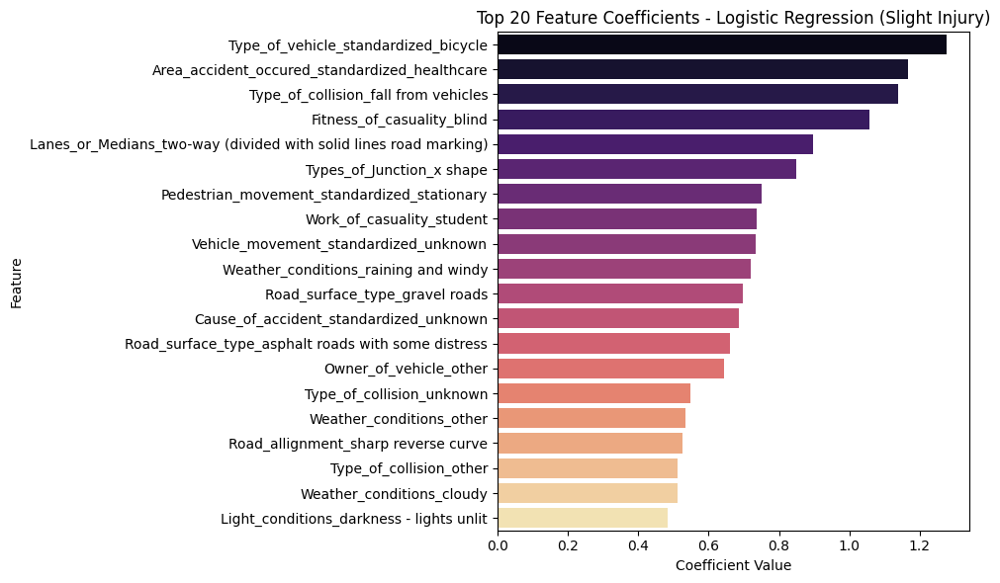


Top Features for Class Serious Injury:
                                               Feature  Coefficient
51                      Road_surface_type_gravel roads         1.16
27   Lanes_or_Medians_two-way (divided with solid l...         1.08
69                          Weather_conditions_unknown         0.95
78                           Type_of_collision_unknown         0.88
44                           Types_of_Junction_t shape         0.82
92                           Work_of_casuality_student         0.78
93                        Work_of_casuality_unemployed         0.78
112      Area_accident_occured_standardized_healthcare         0.73
59            Light_conditions_darkness - lights unlit         0.71
126              Vehicle_movement_standardized_turning         0.67


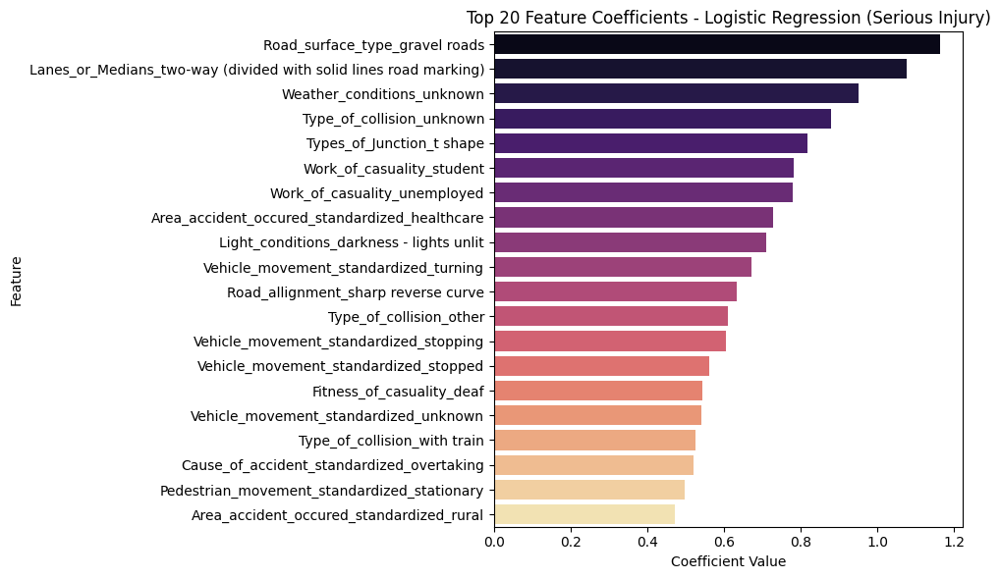


Top Features for Class Fatal Injury:
                                               Feature  Coefficient
121           Vehicle_movement_standardized_overtaking         2.26
66                          Weather_conditions_raining         1.97
64                           Weather_conditions_normal         1.91
34   Road_allignment_steep grade upward with mounta...         1.89
98                          Fitness_of_casuality_other         1.78
119         Area_accident_occured_standardized_unknown         1.74
50                       Road_surface_type_earth roads         1.28
72        Type_of_collision_collision with pedestrians         1.07
131           Pedestrian_movement_standardized_unknown         1.03
73   Type_of_collision_collision with roadside objects         1.02


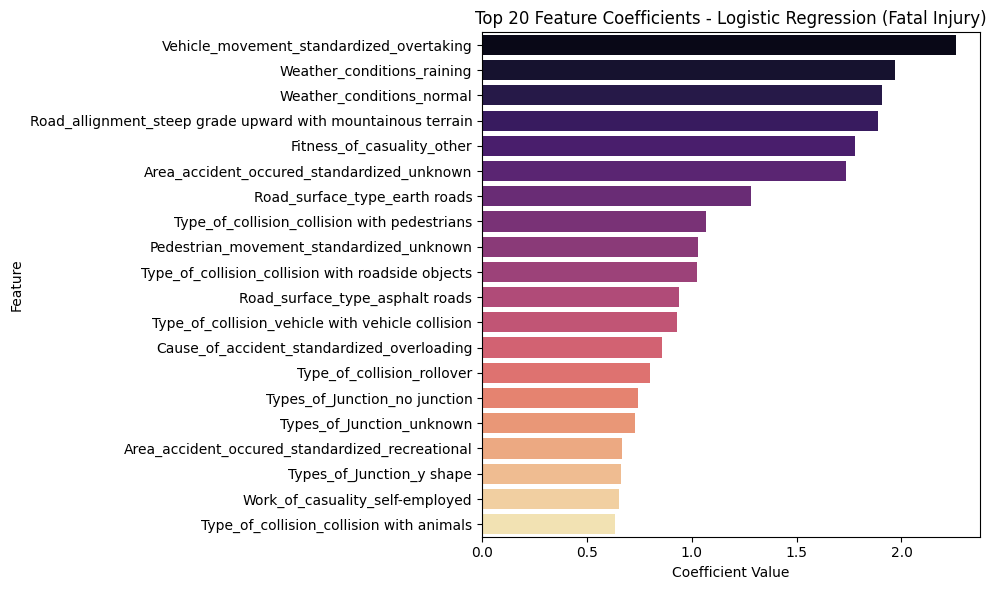

In [ ]:
# Feature Importance from Logistic Regression
coefficients_lr = log_reg.coef_
feature_names_lr = X_lr.columns
classes_lr = ['Slight Injury', 'Serious Injury', 'Fatal Injury']

# Create a DataFrame for each class
for idx, class_name in enumerate(classes_lr):
    coef_df_lr = pd.DataFrame({
        'Feature': feature_names_lr,
        'Coefficient': coefficients_lr[idx]
    }).sort_values(by='Coefficient', ascending=False)

    # Display the top features for the class
    print(f"\nTop Features for Class {class_name}:")
    print(coef_df_lr.head(10))

    # Plot Top 20 Coefficients
    plt.figure(figsize=(10,6))
    sns.barplot(x='Coefficient', y='Feature', data=coef_df_lr.head(20), palette='magma')
    plt.title(f'Top 20 Feature Coefficients - Logistic Regression ({class_name})')
    plt.xlabel('Coefficient Value')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.savefig(f'Logistic_Regression_Feature_Coefficients_{class_name}.png')
    plt.show()


In [ ]:
# Initialize SHAP Explainer for Logistic Regression
explainer_lr = shap.LinearExplainer(log_reg, X_train_lr, feature_dependence="independent")

# Calculate SHAP values
shap_values_lr = explainer_lr.shap_values(X_test_lr)


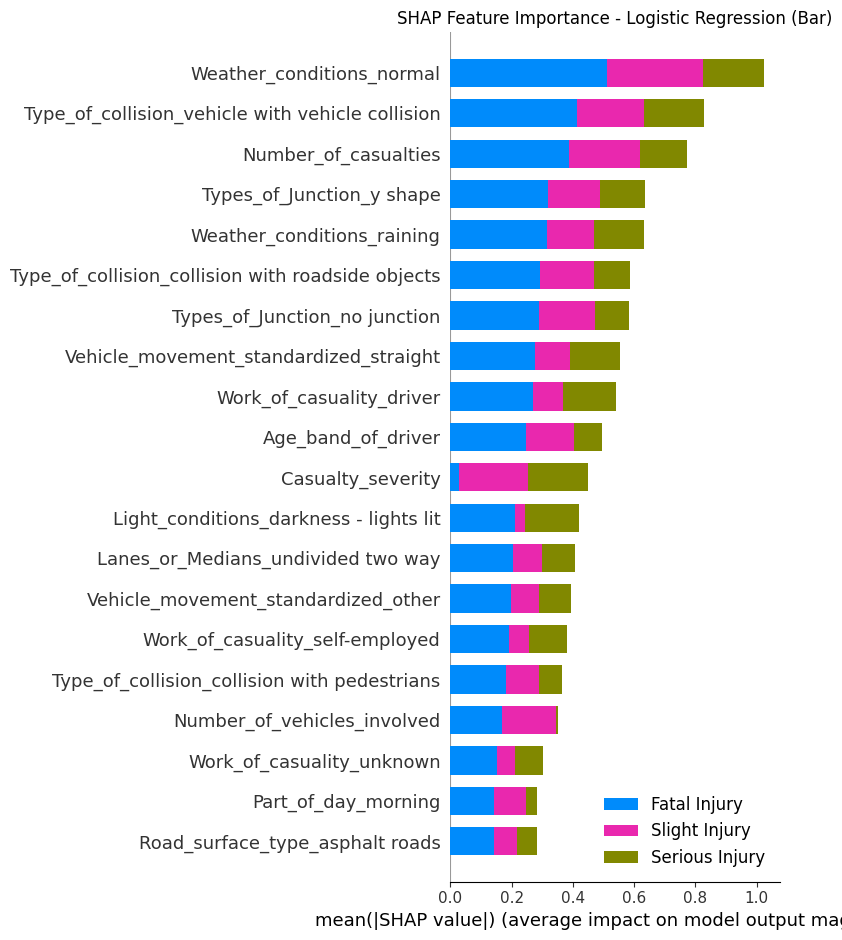

In [ ]:
# SHAP Summary Plot (Bar) for Logistic Regression
plt.figure(figsize=(12,8))
shap.summary_plot(shap_values_lr, X_test_lr, plot_type="bar", class_names=['Slight Injury', 'Serious Injury', 'Fatal Injury'], show=False)
plt.title('SHAP Feature Importance - Logistic Regression (Bar)')
plt.tight_layout()
plt.savefig('SHAP_Summary_Bar_LR.png')
plt.show()


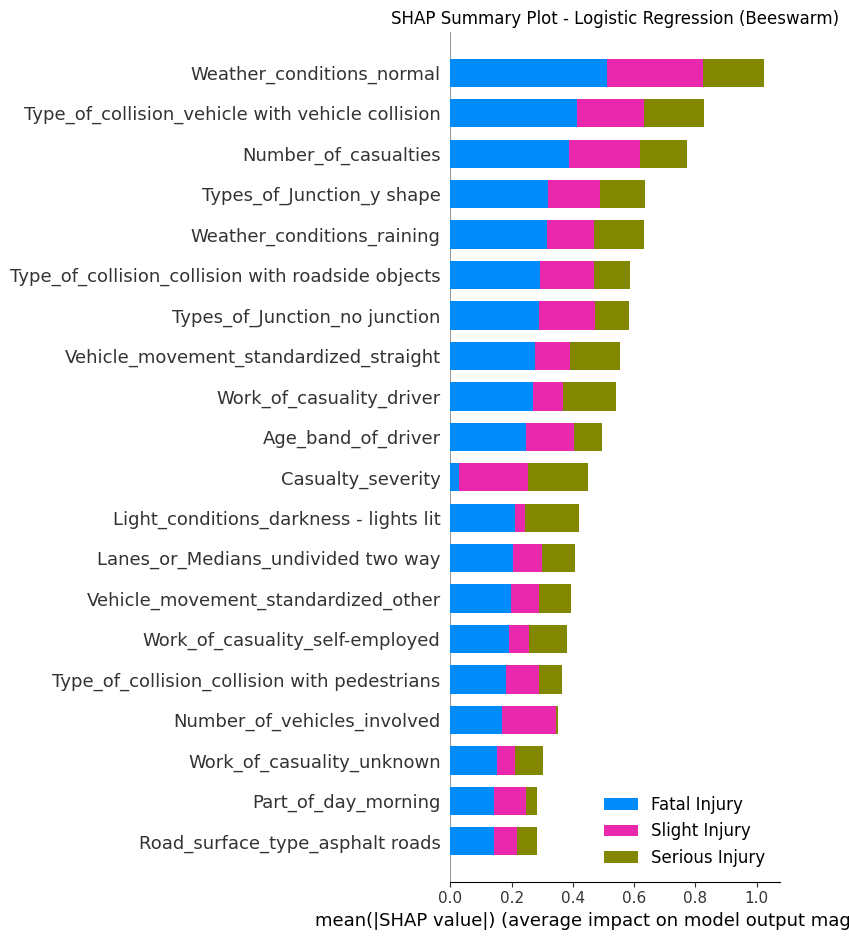

In [ ]:
# SHAP Summary Plot (Beeswarm) for Logistic Regression
plt.figure(figsize=(12,8))
shap.summary_plot(shap_values_lr, X_test_lr, feature_names=feature_names_lr, class_names=['Slight Injury', 'Serious Injury', 'Fatal Injury'], show=False)
plt.title('SHAP Summary Plot - Logistic Regression (Beeswarm)')
plt.tight_layout()
plt.savefig('SHAP_Summary_Beeswarm_LR.png')
plt.show()


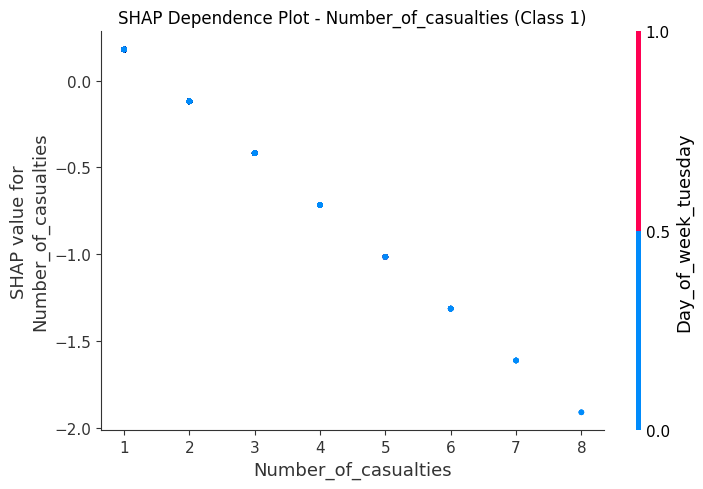

In [ ]:
# SHAP Dependence Plot for 'Number_of_casualties' for Class 1
shap.dependence_plot('Number_of_casualties', shap_values_lr[0], X_test_lr, show=False)
plt.title('SHAP Dependence Plot - Number_of_casualties (Class 1)')
plt.tight_layout()
plt.savefig('SHAP_Dependence_Number_of_casualties_Class1_LR.png')
plt.show()


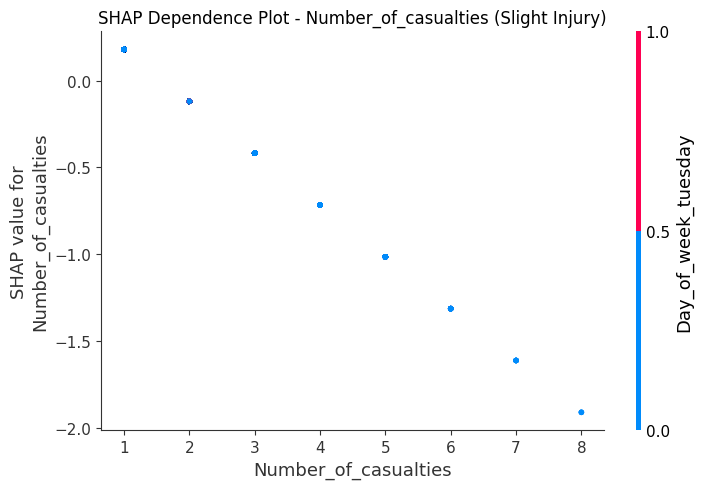

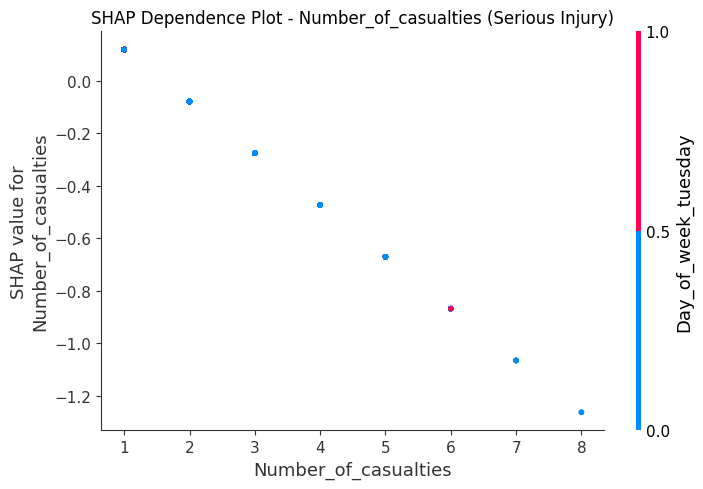

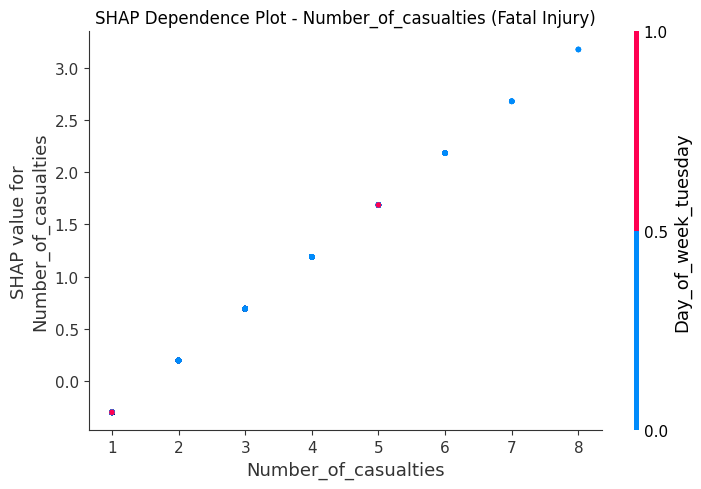

In [ ]:
# Iterate through each class to create SHAP Dependence Plots
for i, class_name in enumerate(['Slight Injury', 'Serious Injury', 'Fatal Injury']):
    shap.dependence_plot('Number_of_casualties', shap_values_lr[i], X_test_lr, show=False)
    plt.title(f'SHAP Dependence Plot - Number_of_casualties ({class_name})')
    plt.tight_layout()
    plt.savefig(f'SHAP_Dependence_Number_of_casualties_{class_name}_LR.png')
    plt.show()


In [ ]:
# Initialize LIME Explainer
lime_explainer_lr = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_lr),
    feature_names=feature_names_lr,
    class_names=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
    mode='classification'
)


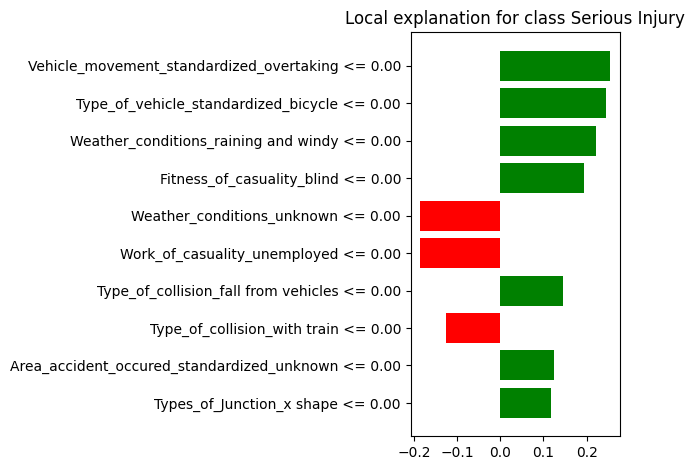

In [ ]:
# Select an instance to explain
i_lr = 20  # Change this index as needed
exp_lr = lime_explainer_lr.explain_instance(
    data_row=X_test_lr.iloc[i_lr],
    predict_fn=log_reg.predict_proba,
    num_features=10
)

# Display the explanation in the notebook
exp_lr.show_in_notebook(show_table=True)

# For script-based environments, save the explanation as a figure
fig_lr = exp_lr.as_pyplot_figure()
plt.tight_layout()
plt.savefig('LIME_Explanation_LR_Instance_20.png')
plt.show()


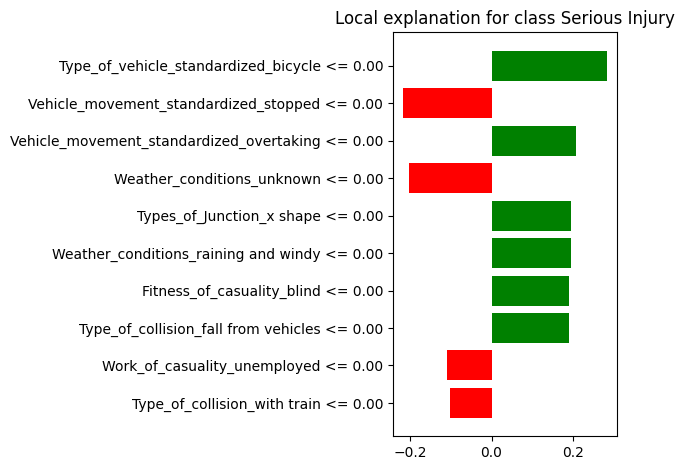

In [ ]:
# Select an instance to explain
i_lr = 80  # Change this index as needed
exp_lr = lime_explainer_lr.explain_instance(
    data_row=X_test_lr.iloc[i_lr],
    predict_fn=log_reg.predict_proba,
    num_features=10
)

# Display the explanation in the notebook
exp_lr.show_in_notebook(show_table=True)

# For script-based environments, save the explanation as a figure
fig_lr = exp_lr.as_pyplot_figure()
plt.tight_layout()
plt.savefig('LIME_Explanation_LR_Instance_20.png')
plt.show()


ValueError: target must be specified for multi-class

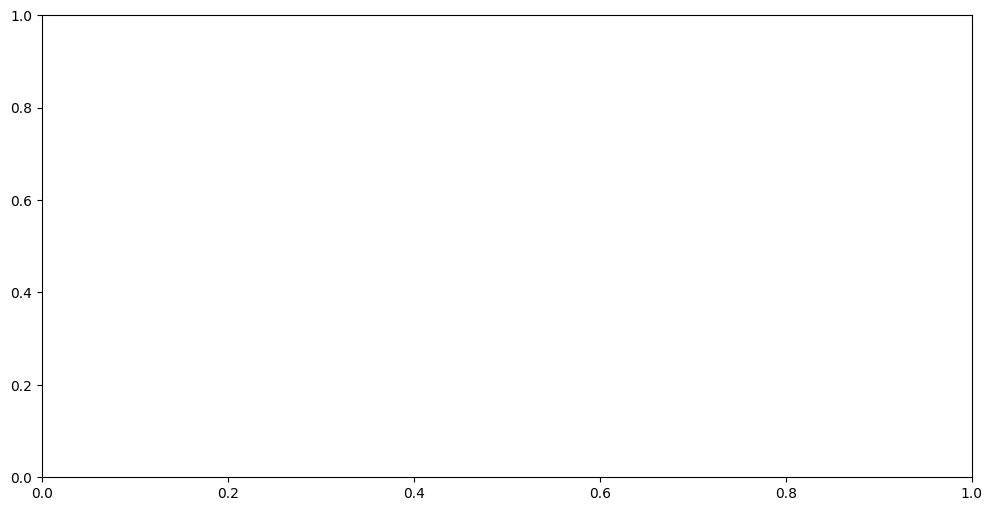

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

# Select features to plot
features_to_plot_lr_pdp = ['Number_of_casualties', 'Driving_experience']

# Plot Partial Dependence Plots for Logistic Regression
fig_lr_pdp, ax_lr_pdp = plt.subplots(figsize=(12,6))
PartialDependenceDisplay.from_estimator(
    log_reg,
    X_test_lr,
    features=features_to_plot_lr_pdp,
    grid_resolution=20,
    ax=ax_lr_pdp
)
plt.tight_layout()
plt.savefig('Partial_Dependence_Plots_LR.png')
plt.show()


In [ ]:
# Predictions from Logistic Regression
y_pred_lr = log_reg.predict(X_test_lr)
y_proba_lr = log_reg.predict_proba(X_test_lr)


In [ ]:
# Classification Report
print("\nLogistic Regression - Classification Report:")
print(classification_report(y_test_lr, y_pred_lr))



Logistic Regression - Classification Report:
              precision    recall  f1-score   support

           1       0.88      0.51      0.65      2084
           2       0.17      0.38      0.24       349
           3       0.03      0.48      0.06        31

    accuracy                           0.49      2464
   macro avg       0.36      0.46      0.31      2464
weighted avg       0.77      0.49      0.58      2464



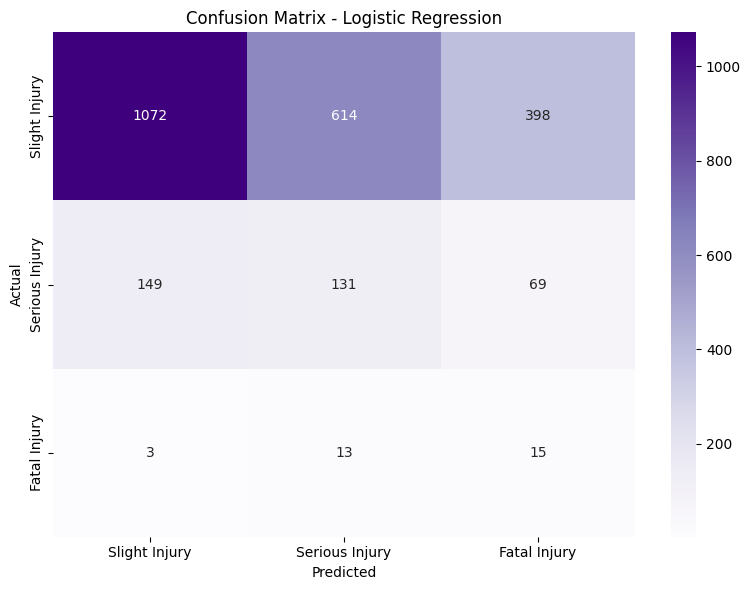

In [ ]:
# Confusion Matrix
cm_lr = confusion_matrix(y_test_lr, y_pred_lr)
plt.figure(figsize=(8,6))
sns.heatmap(cm_lr, annot=True, fmt='d', cmap='Purples',
            xticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
            yticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Logistic Regression')
plt.tight_layout()
plt.savefig('Confusion_Matrix_LR.png')
plt.show()


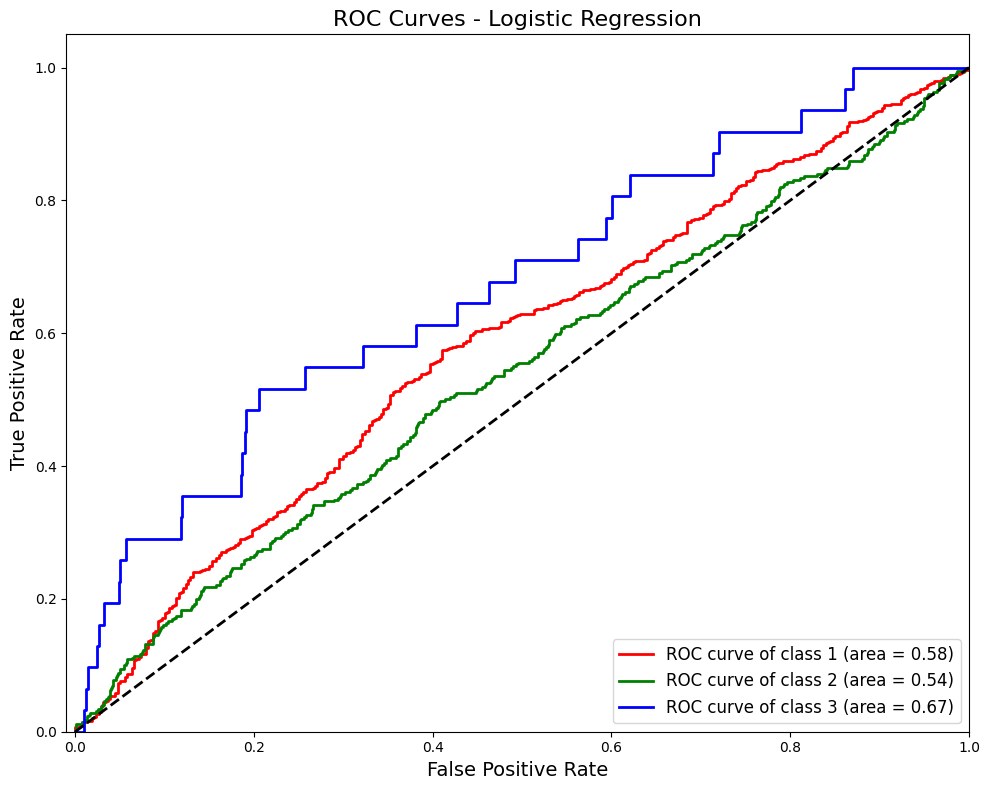

In [ ]:
# Binarize the output for ROC
y_test_binarized_lr = label_binarize(y_test_lr, classes=[1,2,3])
n_classes_lr = y_test_binarized_lr.shape[1]

# Compute ROC curve and ROC area for each class
fpr_lr = dict()
tpr_lr = dict()
roc_auc_lr = dict()

for i in range(n_classes_lr):
    fpr_lr[i], tpr_lr[i], _ = roc_curve(y_test_binarized_lr[:, i], y_proba_lr[:, i])
    roc_auc_lr[i] = auc(fpr_lr[i], tpr_lr[i])

# Compute micro-average ROC curve and ROC area
fpr_lr["micro"], tpr_lr["micro"], _ = roc_curve(y_test_binarized_lr.ravel(), y_proba_lr.ravel())
roc_auc_lr["micro"] = auc(fpr_lr["micro"], tpr_lr["micro"])

# Plot all ROC curves
plt.figure(figsize=(10,8))
colors_lr = ['red', 'green', 'blue']
for i, color in zip(range(n_classes_lr), colors_lr):
    plt.plot(fpr_lr[i], tpr_lr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc_lr[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curves - Logistic Regression', fontsize=16)
plt.legend(loc="lower right", fontsize=12)
plt.tight_layout()
plt.savefig('ROC_Curves_LR.png')
plt.show()


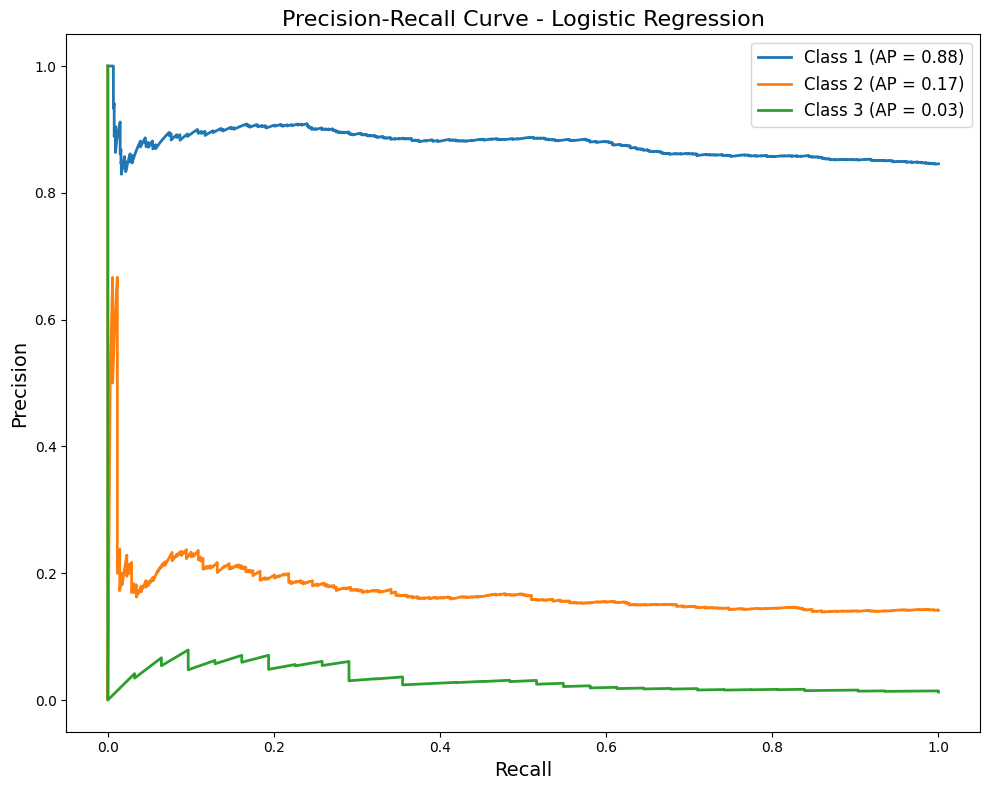

In [ ]:
# Initialize plot
plt.figure(figsize=(10,8))

for i in range(n_classes_lr):
    precision, recall, _ = precision_recall_curve(y_test_binarized_lr[:, i], y_proba_lr[:, i])
    average_precision = average_precision_score(y_test_binarized_lr[:, i], y_proba_lr[:, i])
    plt.plot(recall, precision, lw=2, label='Class {0} (AP = {1:0.2f})'.format(i+1, average_precision))

plt.xlabel('Recall', fontsize=14)
plt.ylabel('Precision', fontsize=14)
plt.title('Precision-Recall Curve - Logistic Regression', fontsize=16)
plt.legend(loc="upper right", fontsize=12)
plt.tight_layout()
plt.savefig('Precision_Recall_Curve_LR.png')
plt.show()


In [ ]:
# Calculate F1-Score for each class
f1_scores_lr = f1_score(y_test_lr, y_pred_lr, average=None)
for i, score in enumerate(f1_scores_lr, 1):
    print(f"F1-Score for Class {i}: {score:.2f}")


F1-Score for Class 1: 0.65
F1-Score for Class 2: 0.24
F1-Score for Class 3: 0.06


In [ ]:
# Cohen's Kappa
kappa_lr = cohen_kappa_score(y_test_lr, y_pred_lr)
print("\nCohen's Kappa (Logistic Regression):", kappa_lr)



Cohen's Kappa (Logistic Regression): 0.0527158935092793


ValueError: target not in est.classes_, got 0

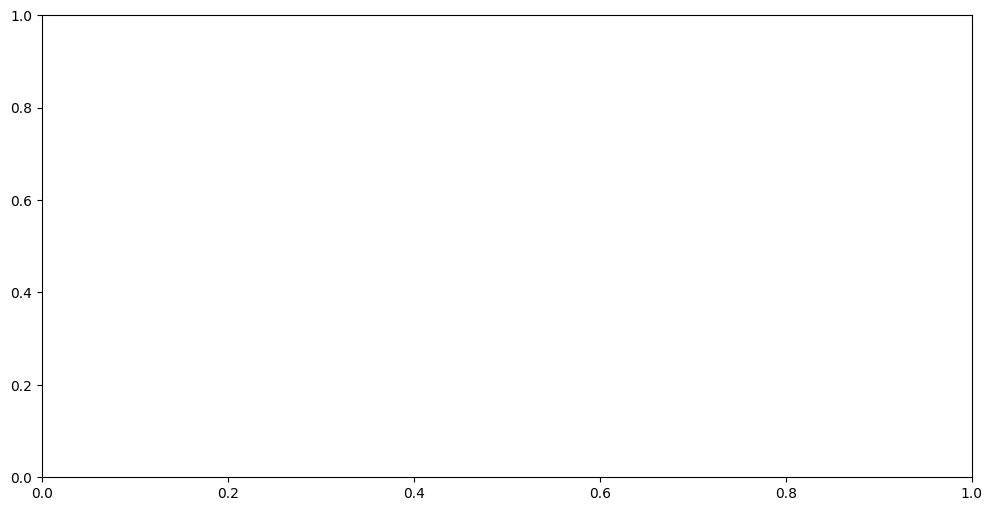

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

# Define class names based on your target encoding
class_names = ['Slight Injury', 'Serious Injury', 'Fatal Injury']

# Select features to plot
features_to_plot_lr_pdp = ['Number_of_casualties', 'Driving_experience']

# Iterate through each class to create PDPs
for i, class_name in enumerate(class_names):
    fig, ax = plt.subplots(figsize=(12,6))
    PartialDependenceDisplay.from_estimator(
        log_reg,
        X_test_lr,
        features=features_to_plot_lr_pdp,
        grid_resolution=20,
        target=i,  # Specify the class index
        ax=ax
    )
    plt.title(f'Partial Dependence Plots - Logistic Regression ({class_name})')
    plt.tight_layout()
    plt.savefig(f'Partial_Dependence_Plots_LR_{class_name}.png')
    plt.show()


NOW RUNNING AN FFS AND ADRESSING THE MODEL IMBALANCE FOR MINORITY CLASSES

In [ ]:
from sklearn.feature_selection import SequentialFeatureSelector

# Initialize the Decision Tree Classifier
dt_classifier_fs = DecisionTreeClassifier(random_state=42, class_weight='balanced')

# Initialize Sequential Feature Selector
sfs_dt = SequentialFeatureSelector(
    dt_classifier_fs,
    n_features_to_select='auto',  # Let the selector choose
    direction='forward',
    scoring='f1_macro',
    cv=5,
    n_jobs=-1
)

# Fit the selector
sfs_dt.fit(X_train_dt, y_train_dt)

# Get the selected features
selected_features_dt = X_train_dt.columns[sfs_dt.get_support()]
print("\nSelected Features for Decision Tree:", list(selected_features_dt))



Selected Features for Decision Tree: ['Day_of_week_friday', 'Day_of_week_monday', 'Day_of_week_saturday', 'Day_of_week_sunday', 'Day_of_week_tuesday', 'Day_of_week_wednesday', 'Part_of_day_evening', 'Part_of_day_morning', 'Part_of_day_night', 'Sex_of_driver_unknown', 'Vehicle_driver_relation_other', 'Owner_of_vehicle_other', 'Lanes_or_Medians_two-way (divided with solid lines road marking)', 'Lanes_or_Medians_unknown', 'Road_allignment_escarpments', 'Road_allignment_gentle horizontal curve', 'Road_allignment_sharp reverse curve', 'Road_allignment_steep grade upward with mountainous terrain', 'Road_allignment_tangent road with mild grade and flat terrain', 'Road_allignment_tangent road with rolling terrain', 'Types_of_Junction_no junction', 'Types_of_Junction_o shape', 'Types_of_Junction_t shape', 'Types_of_Junction_unknown', 'Types_of_Junction_x shape', 'Types_of_Junction_y shape', 'Road_surface_type_asphalt roads with some distress', 'Road_surface_type_gravel roads', 'Road_surface_ty

In [ ]:
# Define new feature matrices with selected features
X_train_dt_fs = X_train_dt[selected_features_dt]
X_test_dt_fs = X_test_dt[selected_features_dt]

# Initialize and train the Decision Tree
dt_classifier_fs.fit(X_train_dt_fs, y_train_dt)

print("\nDecision Tree Classifier trained with selected features.")



Decision Tree Classifier trained with selected features.


In [ ]:
# Make predictions
y_pred_dt_fs = dt_classifier_fs.predict(X_test_dt_fs)

# Classification Report
print("\nDecision Tree Classifier (Selected Features) - Classification Report:")
print(classification_report(y_test_dt, y_pred_dt_fs))



Decision Tree Classifier (Selected Features) - Classification Report:
              precision    recall  f1-score   support

           1       0.90      0.79      0.84      2084
           2       0.30      0.48      0.37       349
           3       0.20      0.35      0.25        31

    accuracy                           0.74      2464
   macro avg       0.46      0.54      0.49      2464
weighted avg       0.80      0.74      0.77      2464



IMPROVING PERFORMANCE WITTH SMOTE

In [ ]:
# Install necessary libraries (if not already installed)
!pip install lazypredict shap lime imbalanced-learn openpyxl

# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# For modeling
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report, confusion_matrix, roc_curve, auc,
    roc_auc_score, cohen_kappa_score, precision_recall_curve,
    average_precision_score, f1_score
)
from sklearn.preprocessing import label_binarize

# For XAI
import shap
import lime
import lime.lime_tabular

# For Lazy Predict
from lazypredict.Supervised import LazyClassifier

# For handling class imbalance
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

# For saving models
import joblib

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')


In [ ]:
# Split the data (80% training, 20% testing) with stratification
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print("\nTraining Set Shape:", X_train.shape, y_train.shape)
print("Testing Set Shape:", X_test.shape, y_test.shape)




Training Set Shape: (9852, 155) (9852,)
Testing Set Shape: (2464, 155) (2464,)


In [ ]:
# Initialize SMOTE
smote = SMOTE(random_state=42)


In [ ]:
# Initialize the Decision Tree Classifier with class_weight='balanced'
dt_classifier = DecisionTreeClassifier(random_state=42, class_weight='balanced')

# Create a pipeline with SMOTE and Decision Tree
pipeline_dt_smote = Pipeline([
    ('smote', smote),
    ('classifier', dt_classifier)
])

# Train the pipeline
pipeline_dt_smote.fit(X_train, y_train)

print("\nDecision Tree with SMOTE has been trained.")



Decision Tree with SMOTE has been trained.


In [ ]:
# Initialize the Logistic Regression model with class_weight='balanced'
log_reg = LogisticRegression(max_iter=1000, random_state=42, class_weight='balanced')

# Create a pipeline with SMOTE and Logistic Regression
pipeline_lr_smote = Pipeline([
    ('smote', smote),
    ('classifier', log_reg)
])

# Train the pipeline
pipeline_lr_smote.fit(X_train, y_train)

print("Logistic Regression with SMOTE has been trained.")


Logistic Regression with SMOTE has been trained.


In [ ]:
# Make predictions
y_pred_dt = pipeline_dt_smote.predict(X_test)
y_proba_dt = pipeline_dt_smote.predict_proba(X_test)


In [ ]:
# Make predictions
y_pred_lr = pipeline_lr_smote.predict(X_test)
y_proba_lr = pipeline_lr_smote.predict_proba(X_test)



Feature Importances (Decision Tree):
                                  Feature  Importance
150           Number_of_vehicles_involved        0.10
151                  Number_of_casualties        0.09
41          Types_of_Junction_no junction        0.08
40             Types_of_Junction_crossing        0.04
154                                  Hour        0.04
..                                    ...         ...
67   Weather_conditions_raining and windy        0.00
63         Weather_conditions_fog or mist        0.00
56           Road_surface_conditions_snow        0.00
55        Road_surface_conditions_flooded        0.00
100  Type_of_vehicle_standardized_bicycle        0.00

[155 rows x 2 columns]


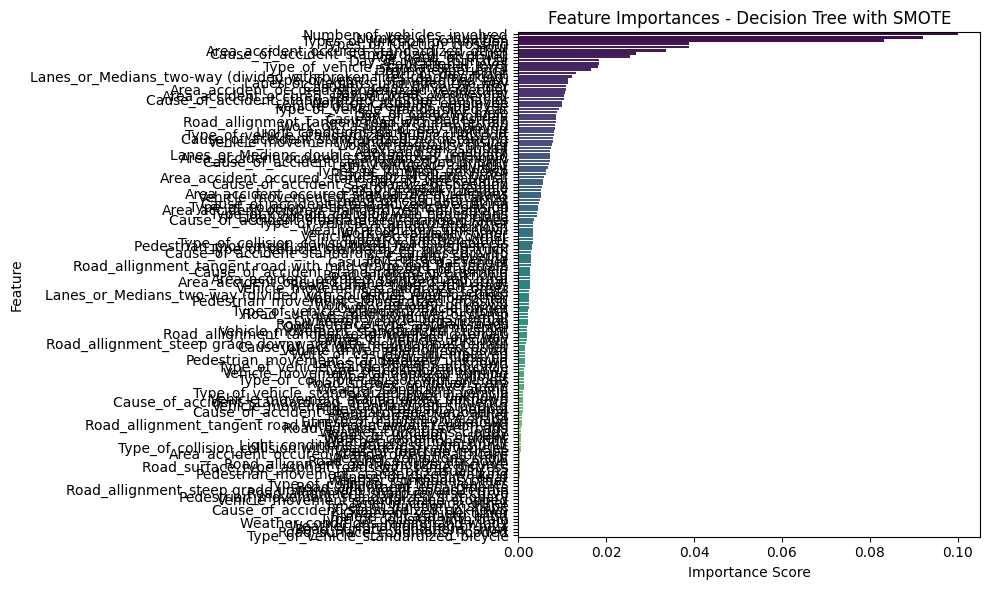

In [ ]:
# Feature Importance from Decision Tree
importances_dt = pipeline_dt_smote.named_steps['classifier'].feature_importances_
feature_names = X.columns
feature_importance_df_dt = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances_dt
}).sort_values(by='Importance', ascending=False)

# Display the feature importance DataFrame
print("\nFeature Importances (Decision Tree):")
print(feature_importance_df_dt)

# Plot Feature Importances
plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df_dt, palette='viridis')
plt.title('Feature Importances - Decision Tree with SMOTE')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.savefig('Feature_Importances_DT_SMOTE.png')
plt.show()



Top Features for Class Slight Injury:
                                               Feature  Coefficient
100               Type_of_vehicle_standardized_bicycle         1.82
95                          Fitness_of_casuality_blind         1.70
112      Area_accident_occured_standardized_healthcare         1.68
27   Lanes_or_Medians_two-way (divided with solid l...         1.50
75                Type_of_collision_fall from vehicles         1.49
46                           Types_of_Junction_x shape         1.26
92                           Work_of_casuality_student         1.20
145             Cause_of_accident_standardized_unknown         1.20
51                      Road_surface_type_gravel roads         1.20
78                           Type_of_collision_unknown         1.12


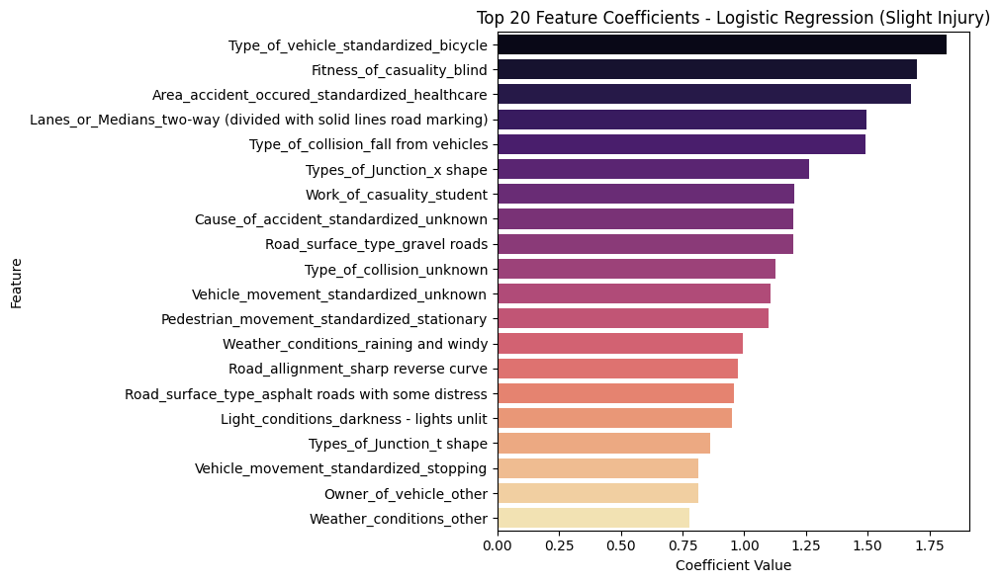


Top Features for Class Serious Injury:
                                               Feature  Coefficient
27   Lanes_or_Medians_two-way (divided with solid l...         1.82
51                      Road_surface_type_gravel roads         1.77
69                          Weather_conditions_unknown         1.45
78                           Type_of_collision_unknown         1.27
93                        Work_of_casuality_unemployed         1.24
112      Area_accident_occured_standardized_healthcare         1.20
59            Light_conditions_darkness - lights unlit         1.16
92                           Work_of_casuality_student         1.13
44                           Types_of_Junction_t shape         1.11
96                           Fitness_of_casuality_deaf         1.10


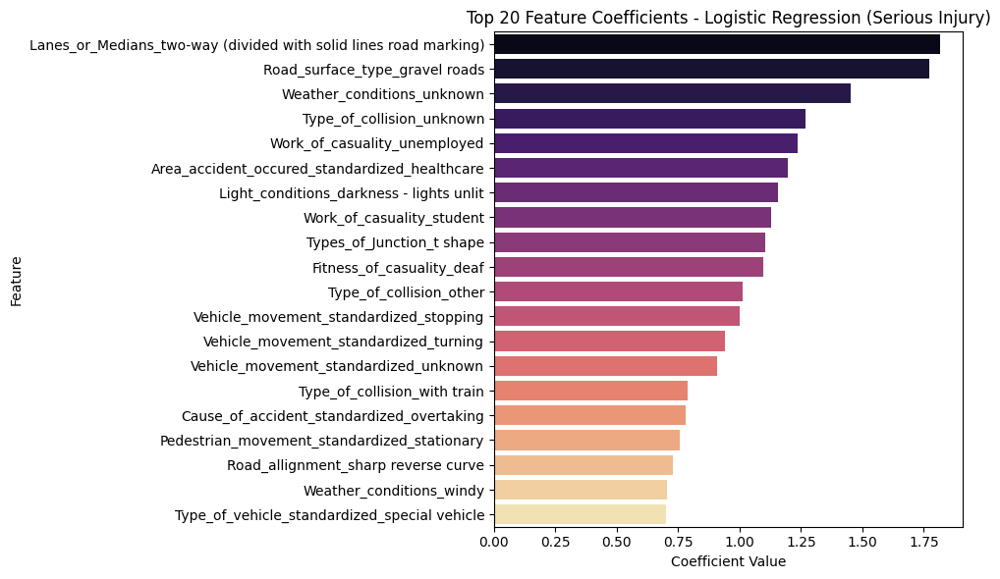


Top Features for Class Fatal Injury:
                                               Feature  Coefficient
121           Vehicle_movement_standardized_overtaking         3.05
34   Road_allignment_steep grade upward with mounta...         2.86
98                          Fitness_of_casuality_other         2.86
66                          Weather_conditions_raining         2.81
64                           Weather_conditions_normal         2.62
119         Area_accident_occured_standardized_unknown         2.48
50                       Road_surface_type_earth roads         1.73
140         Cause_of_accident_standardized_overloading         1.56
73   Type_of_collision_collision with roadside objects         1.56
72        Type_of_collision_collision with pedestrians         1.54


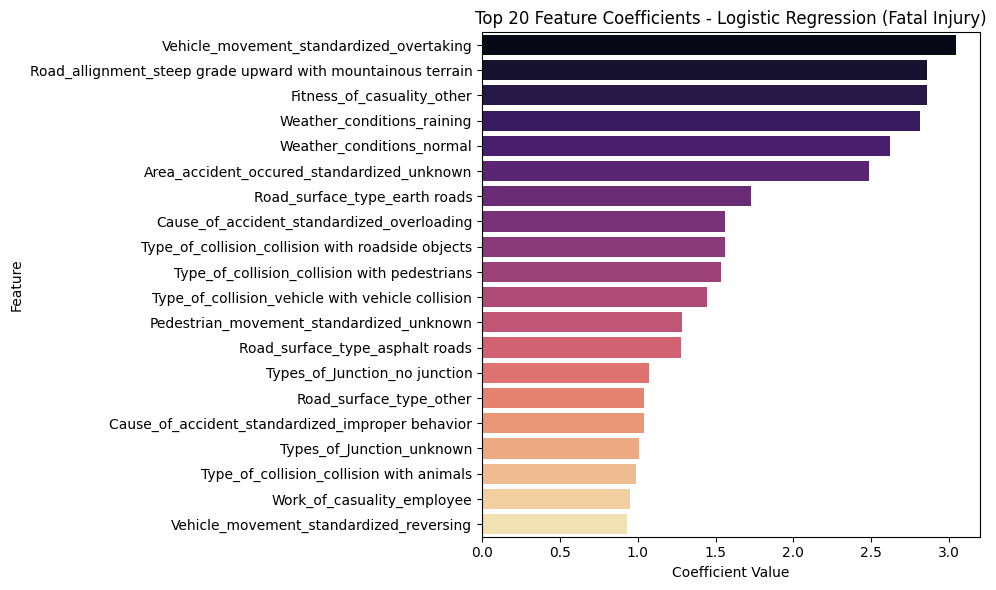

In [ ]:
# Feature Importance from Logistic Regression
coefficients_lr = pipeline_lr_smote.named_steps['classifier'].coef_
feature_names_lr = X.columns
classes_lr = ['Slight Injury', 'Serious Injury', 'Fatal Injury']  # Adjust based on your encoding

# Create a DataFrame for each class
for idx, class_name in enumerate(classes_lr):
    coef_df_lr = pd.DataFrame({
        'Feature': feature_names_lr,
        'Coefficient': coefficients_lr[idx]
    }).sort_values(by='Coefficient', ascending=False)

    # Display the top features for the class
    print(f"\nTop Features for Class {class_name}:")
    print(coef_df_lr.head(10))

    # Plot Coefficients
    plt.figure(figsize=(10,6))
    sns.barplot(x='Coefficient', y='Feature', data=coef_df_lr.head(20), palette='magma')
    plt.title(f'Top 20 Feature Coefficients - Logistic Regression ({class_name})')
    plt.xlabel('Coefficient Value')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.savefig(f'Logistic_Regression_Feature_Coefficients_{class_name}.png')
    plt.show()


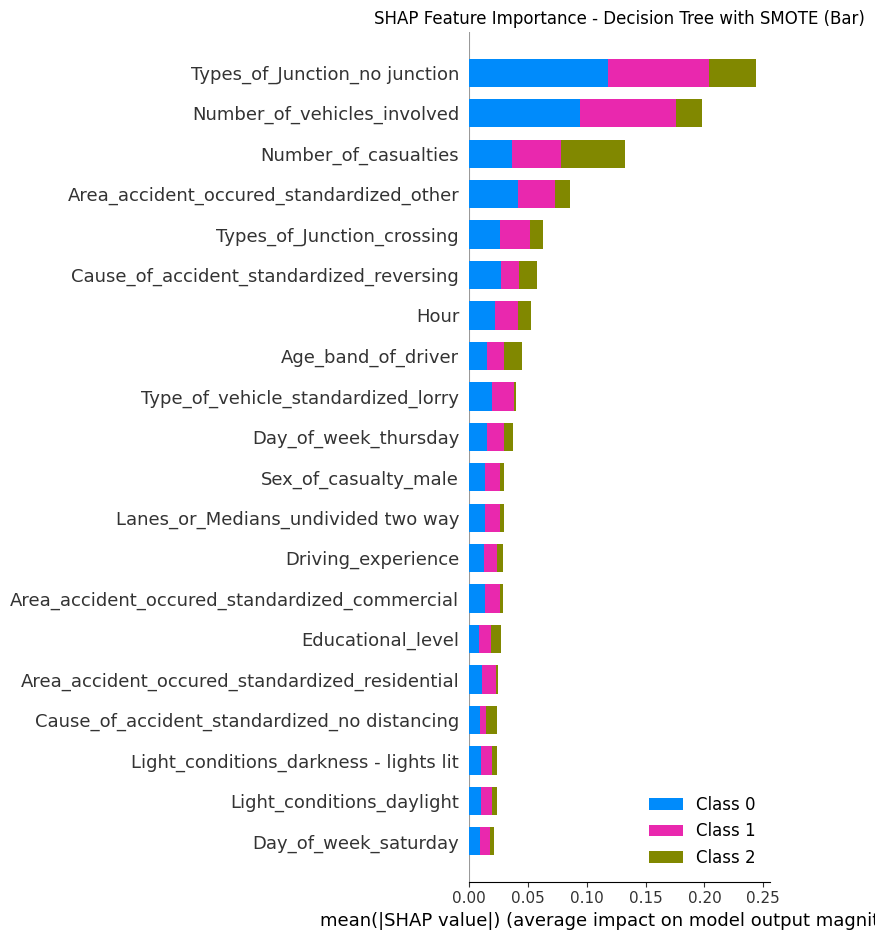

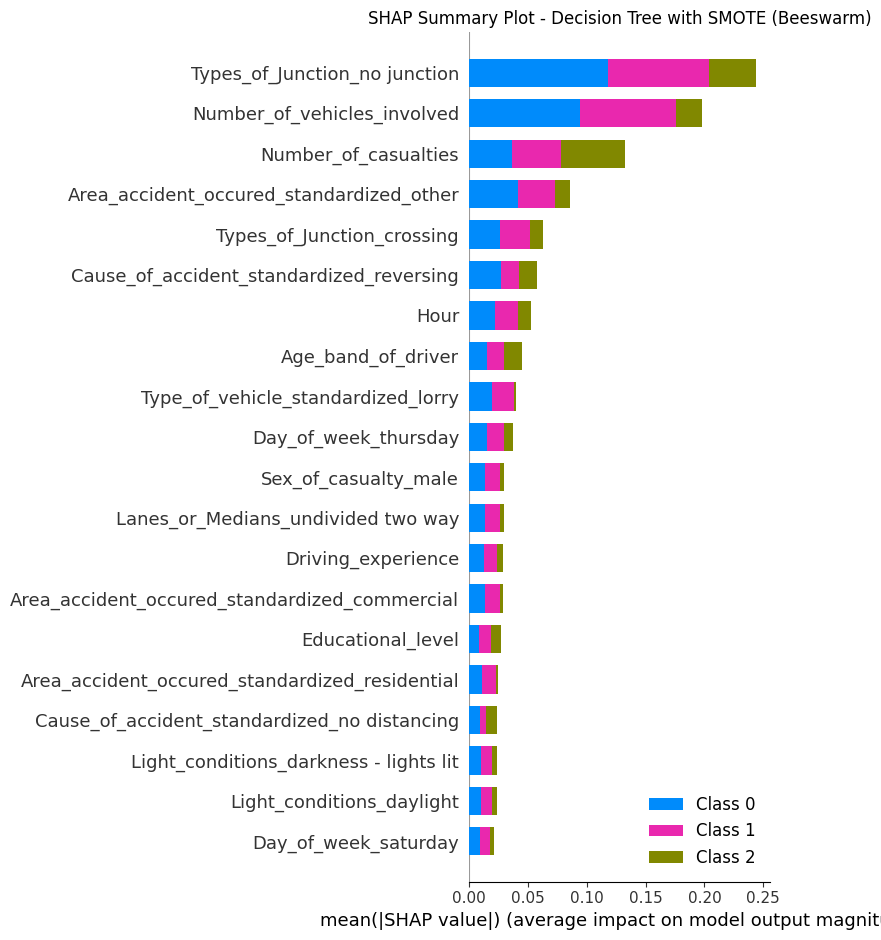

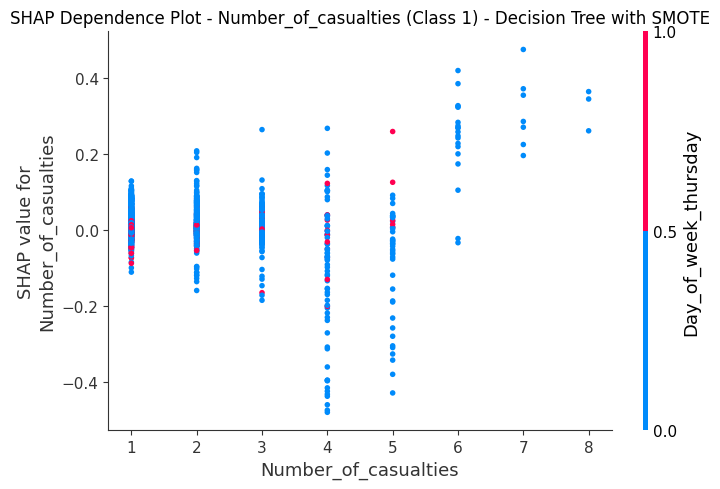

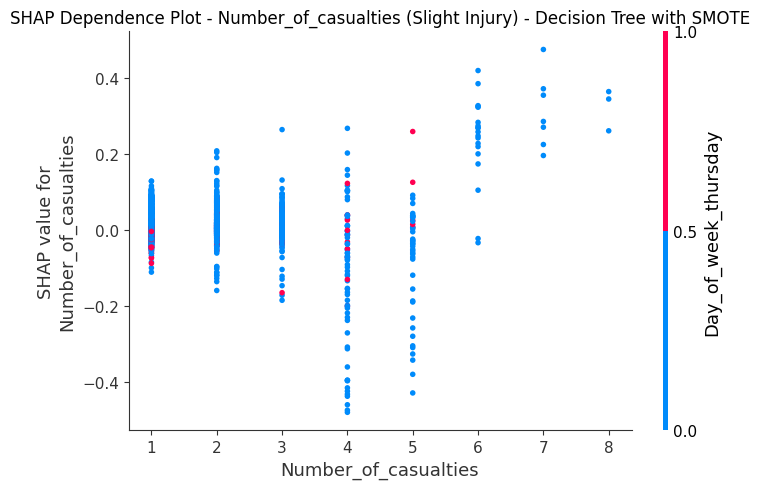

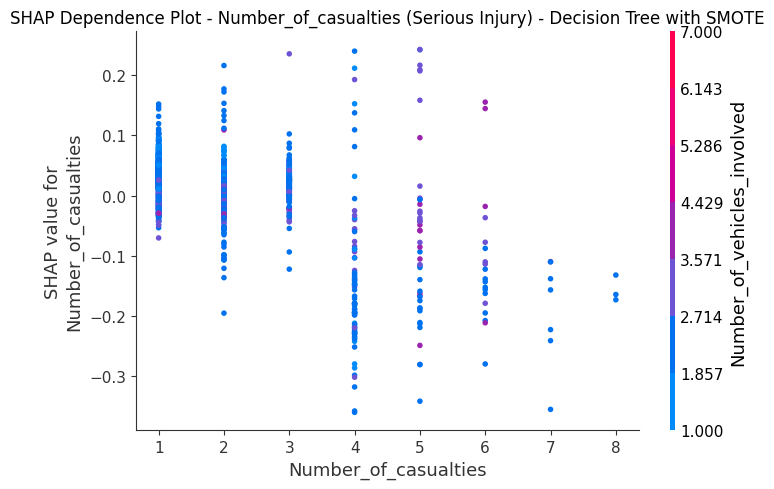

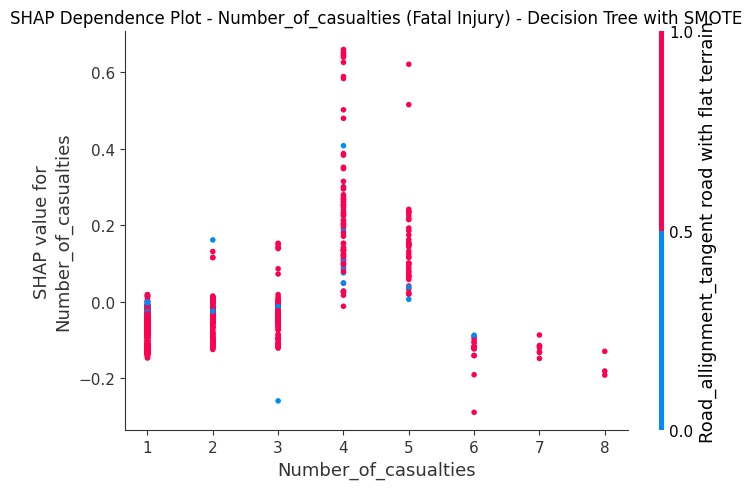

In [ ]:
# Initialize SHAP Explainer for Decision Tree
explainer_dt = shap.TreeExplainer(pipeline_dt_smote.named_steps['classifier'])

# Calculate SHAP values
shap_values_dt = explainer_dt.shap_values(X_test)

# SHAP Summary Plot (Bar)
plt.figure(figsize=(12,8))
shap.summary_plot(shap_values_dt, X_test, plot_type="bar", show=False)
plt.title('SHAP Feature Importance - Decision Tree with SMOTE (Bar)')
plt.tight_layout()
plt.savefig('SHAP_Summary_Bar_DT_SMOTE.png')
plt.show()

# SHAP Summary Plot (Beeswarm)
plt.figure(figsize=(12,8))
shap.summary_plot(shap_values_dt, X_test, show=False)
plt.title('SHAP Summary Plot - Decision Tree with SMOTE (Beeswarm)')
plt.tight_layout()
plt.savefig('SHAP_Summary_Beeswarm_DT_SMOTE.png')
plt.show()

# SHAP Dependence Plot for 'Number_of_casualties' (Class 1)
shap.dependence_plot('Number_of_casualties', shap_values_dt[0], X_test, show=False)
plt.title('SHAP Dependence Plot - Number_of_casualties (Class 1) - Decision Tree with SMOTE')
plt.tight_layout()
plt.savefig('SHAP_Dependence_Number_of_casualties_Class1_DT_SMOTE.png')
plt.show()

# Similarly, create dependence plots for other classes if needed
for i, class_name in enumerate(['Slight Injury', 'Serious Injury', 'Fatal Injury']):
    shap.dependence_plot('Number_of_casualties', shap_values_dt[i], X_test, show=False)
    plt.title(f'SHAP Dependence Plot - Number_of_casualties ({class_name}) - Decision Tree with SMOTE')
    plt.tight_layout()
    plt.savefig(f'SHAP_Dependence_Number_of_casualties_{class_name}_DT_SMOTE.png')
    plt.show()


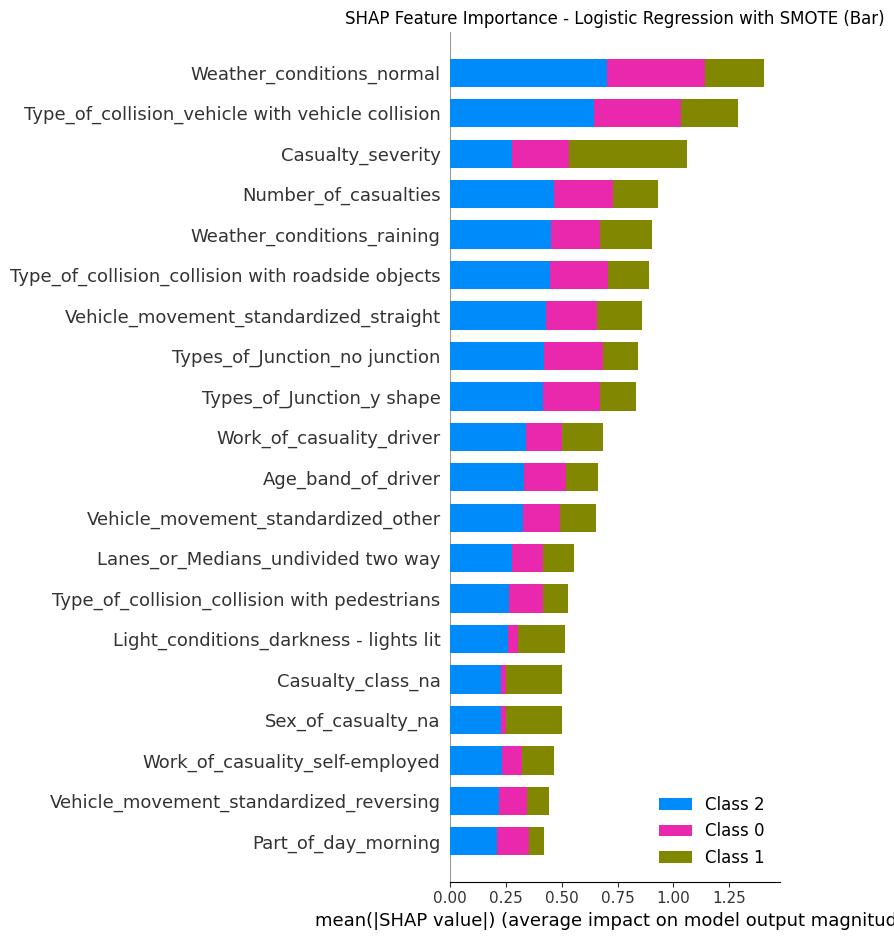

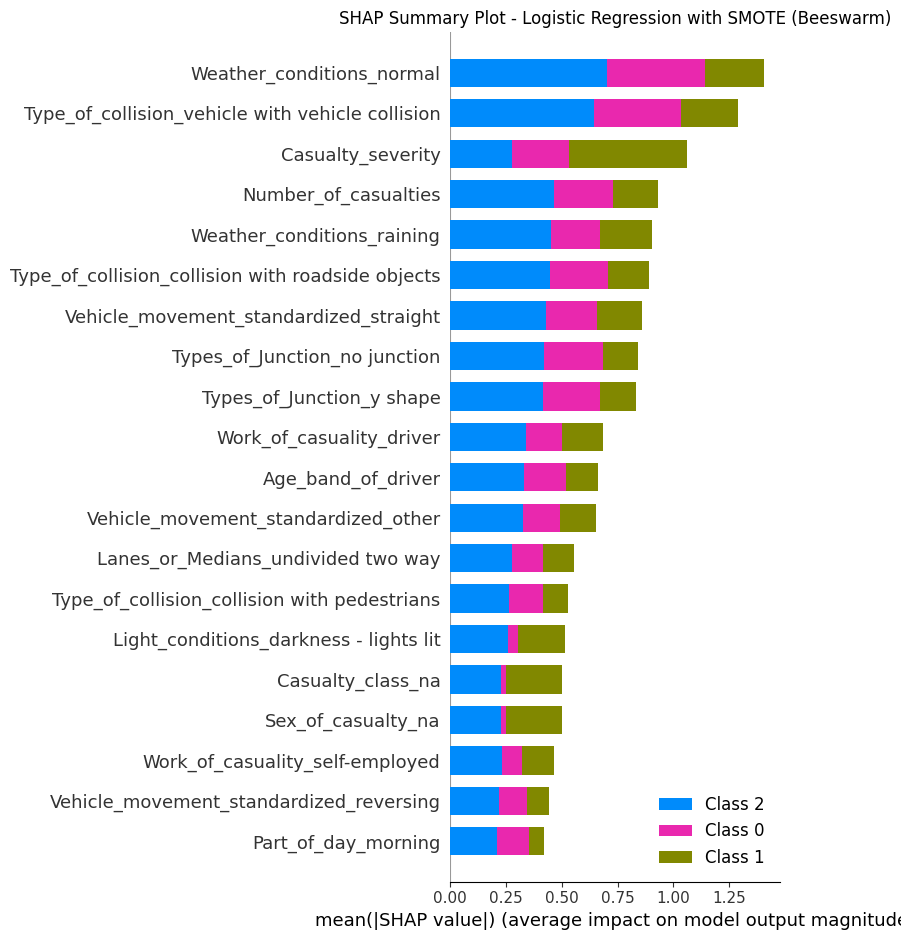

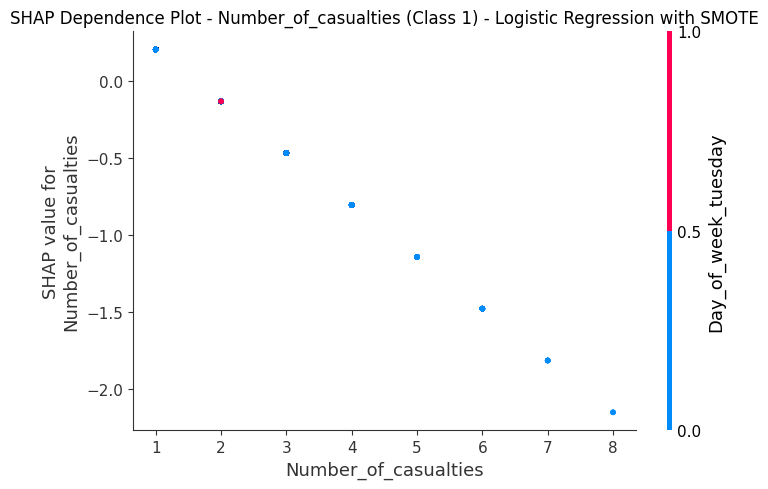

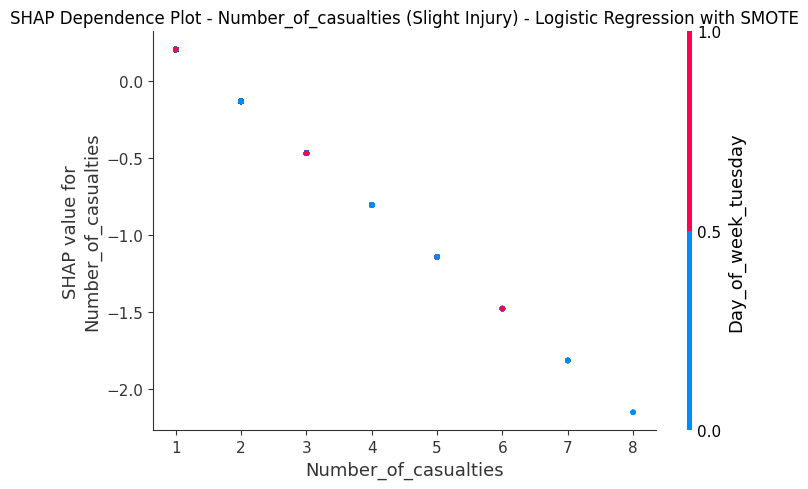

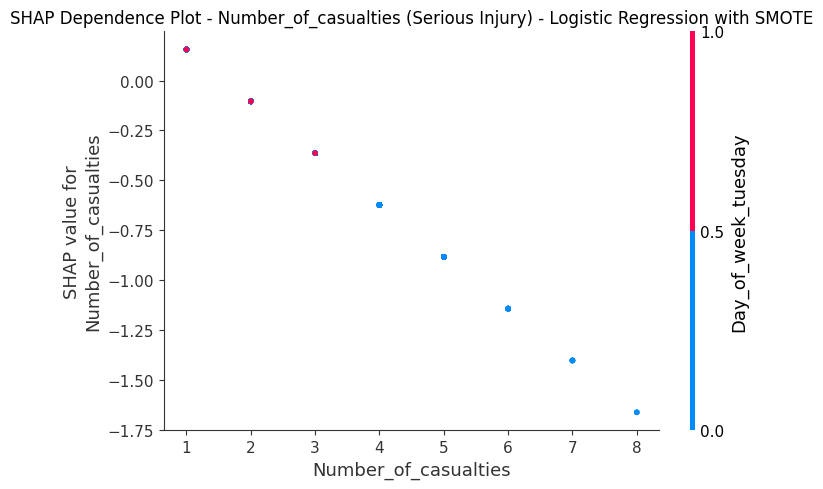

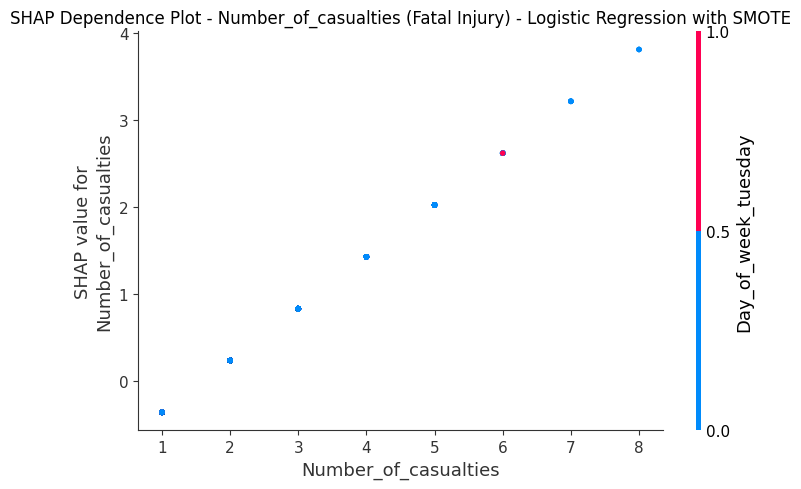

In [ ]:
# Initialize SHAP Explainer for Logistic Regression
explainer_lr = shap.LinearExplainer(pipeline_lr_smote.named_steps['classifier'], X_train, feature_dependence="independent")

# Calculate SHAP values
shap_values_lr = explainer_lr.shap_values(X_test)

# SHAP Summary Plot (Bar)
plt.figure(figsize=(12,8))
shap.summary_plot(shap_values_lr, X_test, plot_type="bar", show=False)
plt.title('SHAP Feature Importance - Logistic Regression with SMOTE (Bar)')
plt.tight_layout()
plt.savefig('SHAP_Summary_Bar_LR_SMOTE.png')
plt.show()

# SHAP Summary Plot (Beeswarm)
plt.figure(figsize=(12,8))
shap.summary_plot(shap_values_lr, X_test, show=False)
plt.title('SHAP Summary Plot - Logistic Regression with SMOTE (Beeswarm)')
plt.tight_layout()
plt.savefig('SHAP_Summary_Beeswarm_LR_SMOTE.png')
plt.show()

# SHAP Dependence Plot for 'Number_of_casualties' (Class 1)
shap.dependence_plot('Number_of_casualties', shap_values_lr[0], X_test, show=False)
plt.title('SHAP Dependence Plot - Number_of_casualties (Class 1) - Logistic Regression with SMOTE')
plt.tight_layout()
plt.savefig('SHAP_Dependence_Number_of_casualties_Class1_LR_SMOTE.png')
plt.show()

# Similarly, create dependence plots for other classes if needed
for i, class_name in enumerate(['Slight Injury', 'Serious Injury', 'Fatal Injury']):
    shap.dependence_plot('Number_of_casualties', shap_values_lr[i], X_test, show=False)
    plt.title(f'SHAP Dependence Plot - Number_of_casualties ({class_name}) - Logistic Regression with SMOTE')
    plt.tight_layout()
    plt.savefig(f'SHAP_Dependence_Number_of_casualties_{class_name}_LR_SMOTE.png')
    plt.show()


In [ ]:
# Initialize LIME Explainer for Decision Tree
lime_explainer_dt = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X.columns,
    class_names=['Slight Injury', 'Serious Injury', 'Fatal Injury'],  # Adjust based on your encoding
    mode='classification'
)


In [ ]:
# Initialize LIME Explainer for Logistic Regression
lime_explainer_lr = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X.columns,
    class_names=['Slight Injury', 'Serious Injury', 'Fatal Injury'],  # Adjust based on your encoding
    mode='classification'
)


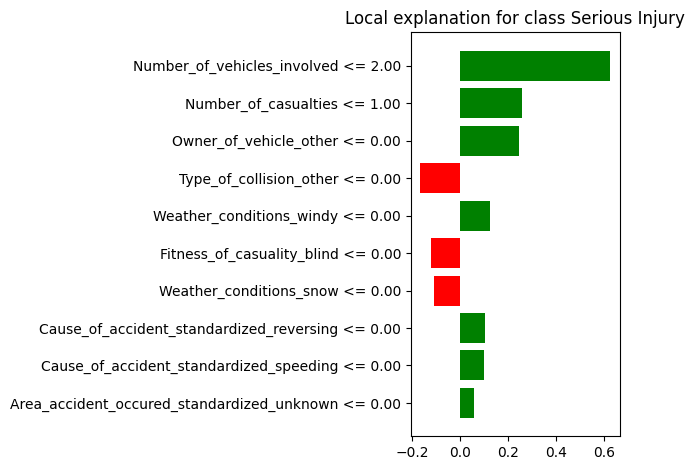

In [ ]:
# Select an instance to explain for Decision Tree
i_dt = 10  # Change this index as needed
exp_dt = lime_explainer_dt.explain_instance(
    data_row=X_test.iloc[i_dt],
    predict_fn=pipeline_dt_smote.predict_proba,
    num_features=10
)

# Display the explanation in the notebook
exp_dt.show_in_notebook(show_table=True)

# For script-based environments, save the explanation as a figure
fig_dt = exp_dt.as_pyplot_figure()
plt.tight_layout()
plt.savefig('LIME_Explanation_DT_Instance_10_SMOTE.png')
plt.show()


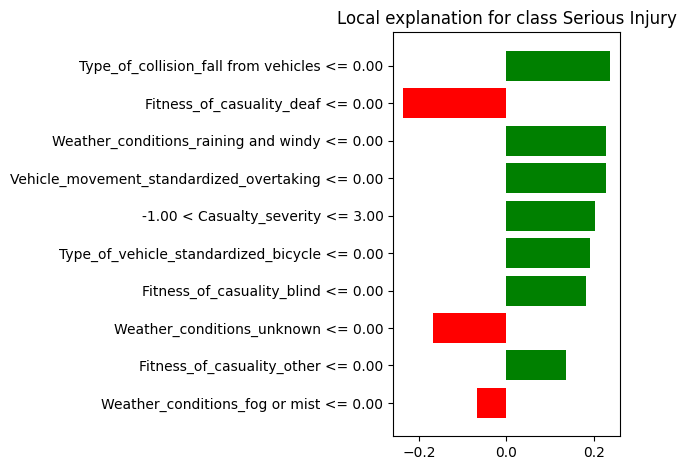

In [ ]:
# Select an instance to explain for Logistic Regression
i_lr = 20  # Change this index as needed
exp_lr = lime_explainer_lr.explain_instance(
    data_row=X_test.iloc[i_lr],
    predict_fn=pipeline_lr_smote.predict_proba,
    num_features=10
)

# Display the explanation in the notebook
exp_lr.show_in_notebook(show_table=True)

# For script-based environments, save the explanation as a figure
fig_lr = exp_lr.as_pyplot_figure()
plt.tight_layout()
plt.savefig('LIME_Explanation_LR_Instance_20_SMOTE.png')
plt.show()


ValueError: target not in est.classes_, got 0

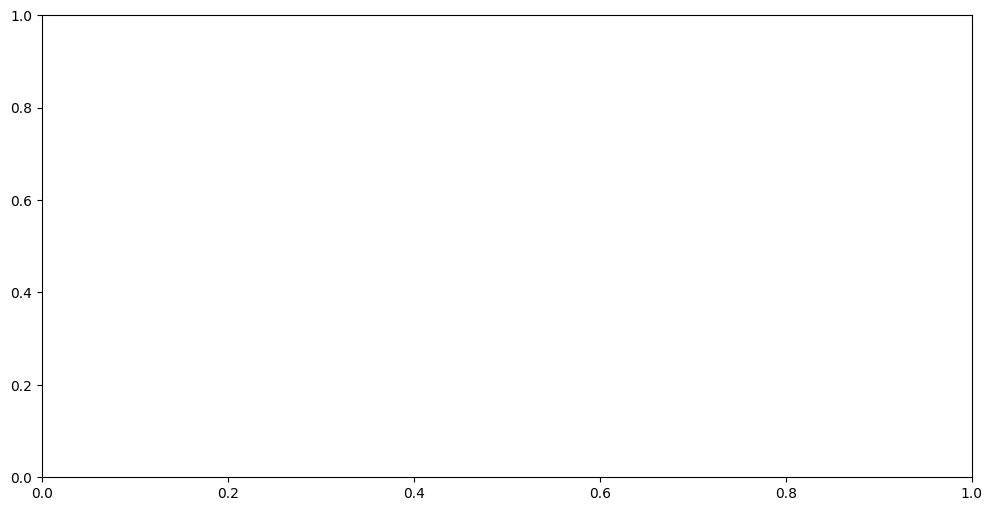

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

# Define class names
class_names = ['Slight Injury', 'Serious Injury', 'Fatal Injury']  # Adjust as per your data

# Select features to plot
features_to_plot_dt_pdp = ['Number_of_casualties', 'Driving_experience']

# Iterate through each class to create PDPs
for i, class_name in enumerate(class_names):
    fig, ax = plt.subplots(figsize=(12,6))
    PartialDependenceDisplay.from_estimator(
        pipeline_dt_smote.named_steps['classifier'],
        X_test,
        features=features_to_plot_dt_pdp,
        grid_resolution=20,
        target=i,  # Specify the class index
        ax=ax
    )
    plt.title(f'Partial Dependence Plots - Decision Tree with SMOTE ({class_name})')
    plt.tight_layout()
    plt.savefig(f'Partial_Dependence_Plots_DT_SMOTE_{class_name}.png')
    plt.show()


ValueError: target not in est.classes_, got 0

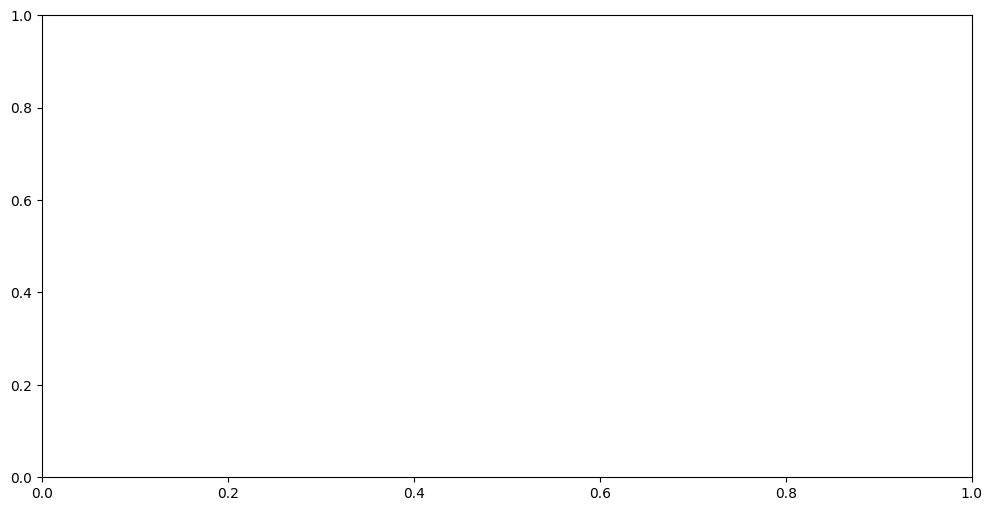

In [ ]:
# Select features to plot
features_to_plot_lr_pdp = ['Number_of_casualties', 'Driving_experience']

# Iterate through each class to create PDPs
for i, class_name in enumerate(class_names):
    fig, ax = plt.subplots(figsize=(12,6))
    PartialDependenceDisplay.from_estimator(
        pipeline_lr_smote.named_steps['classifier'],
        X_test,
        features=features_to_plot_lr_pdp,
        grid_resolution=20,
        target=i,  # Specify the class index
        ax=ax
    )
    plt.title(f'Partial Dependence Plots - Logistic Regression with SMOTE ({class_name})')
    plt.tight_layout()
    plt.savefig(f'Partial_Dependence_Plots_LR_SMOTE_{class_name}.png')
    plt.show()


In [ ]:
# Classification Report for Decision Tree
print("\nDecision Tree with SMOTE - Classification Report:")
print(classification_report(y_test, y_pred_dt))



Decision Tree with SMOTE - Classification Report:
              precision    recall  f1-score   support

           1       0.86      0.85      0.85      2084
           2       0.22      0.23      0.23       349
           3       0.09      0.16      0.12        31

    accuracy                           0.75      2464
   macro avg       0.39      0.41      0.40      2464
weighted avg       0.76      0.75      0.76      2464



In [ ]:
# Classification Report for Logistic Regression
print("\nLogistic Regression with SMOTE - Classification Report:")
print(classification_report(y_test, y_pred_lr))



Logistic Regression with SMOTE - Classification Report:
              precision    recall  f1-score   support

           1       0.88      0.50      0.63      2084
           2       0.18      0.42      0.25       349
           3       0.02      0.35      0.05        31

    accuracy                           0.48      2464
   macro avg       0.36      0.42      0.31      2464
weighted avg       0.77      0.48      0.57      2464



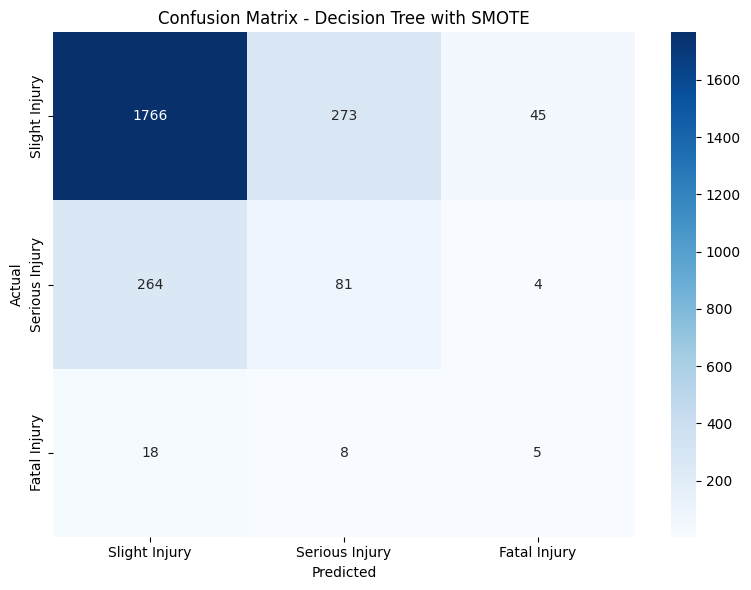

In [ ]:
# Confusion Matrix for Decision Tree
cm_dt = confusion_matrix(y_test, y_pred_dt)
plt.figure(figsize=(8,6))
sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
            yticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Decision Tree with SMOTE')
plt.tight_layout()
plt.savefig('Confusion_Matrix_DT_SMOTE.png')
plt.show()


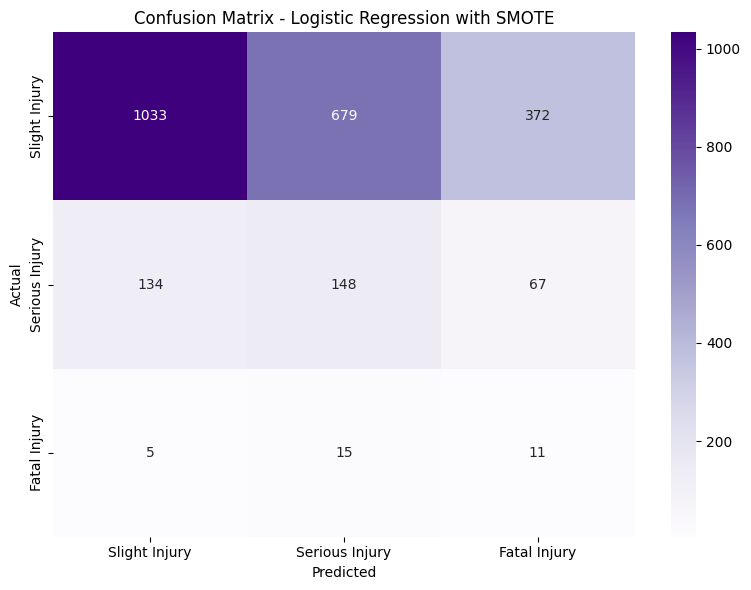

In [ ]:
# Confusion Matrix for Logistic Regression
cm_lr = confusion_matrix(y_test, y_pred_lr)
plt.figure(figsize=(8,6))
sns.heatmap(cm_lr, annot=True, fmt='d', cmap='Purples',
            xticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
            yticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Logistic Regression with SMOTE')
plt.tight_layout()
plt.savefig('Confusion_Matrix_LR_SMOTE.png')
plt.show()


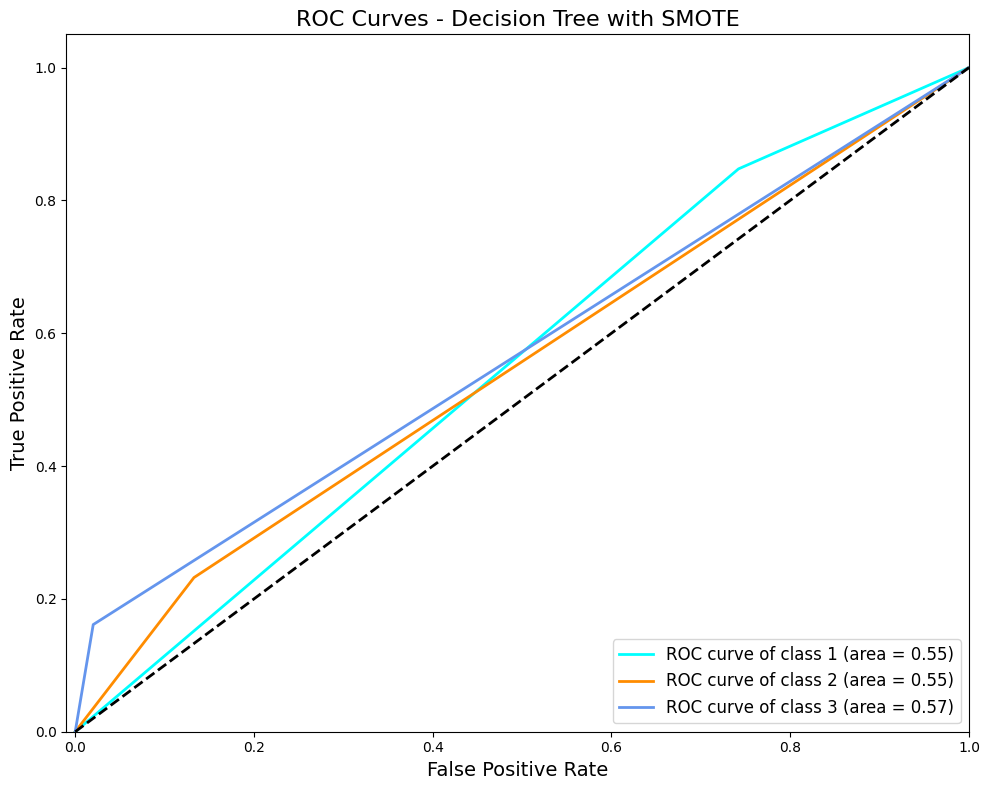

In [ ]:
# Binarize the output for ROC
y_test_binarized_dt = label_binarize(y_test, classes=[1,2,3])
n_classes_dt = y_test_binarized_dt.shape[1]

# Compute ROC curve and ROC area for each class
fpr_dt = dict()
tpr_dt = dict()
roc_auc_dt = dict()

for i in range(n_classes_dt):
    fpr_dt[i], tpr_dt[i], _ = roc_curve(y_test_binarized_dt[:, i], y_proba_dt[:, i])
    roc_auc_dt[i] = auc(fpr_dt[i], tpr_dt[i])

# Plot all ROC curves
plt.figure(figsize=(10,8))
colors_dt = ['aqua', 'darkorange', 'cornflowerblue']
for i, color in zip(range(n_classes_dt), colors_dt):
    plt.plot(fpr_dt[i], tpr_dt[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc_dt[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curves - Decision Tree with SMOTE', fontsize=16)
plt.legend(loc="lower right", fontsize=12)
plt.tight_layout()
plt.savefig('ROC_Curves_DT_SMOTE.png')
plt.show()


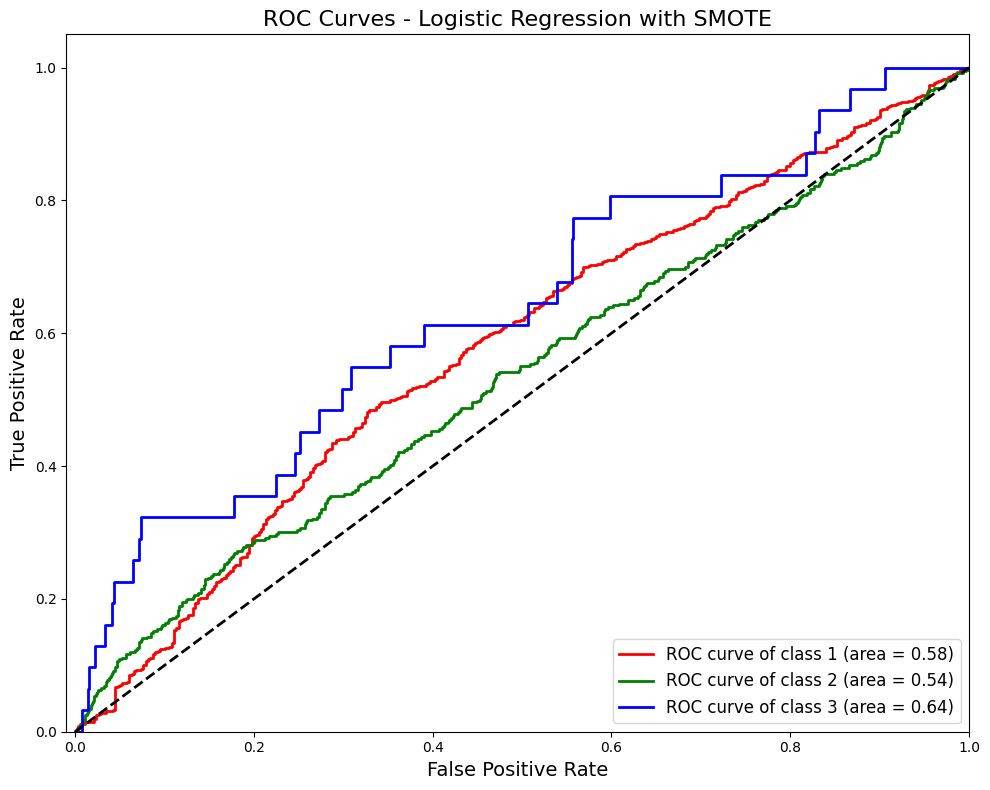

In [ ]:
# Binarize the output for ROC
y_test_binarized_lr = label_binarize(y_test, classes=[1,2,3])
n_classes_lr = y_test_binarized_lr.shape[1]

# Compute ROC curve and ROC area for each class
fpr_lr = dict()
tpr_lr = dict()
roc_auc_lr = dict()

for i in range(n_classes_lr):
    fpr_lr[i], tpr_lr[i], _ = roc_curve(y_test_binarized_lr[:, i], y_proba_lr[:, i])
    roc_auc_lr[i] = auc(fpr_lr[i], tpr_lr[i])

# Plot all ROC curves
plt.figure(figsize=(10,8))
colors_lr = ['red', 'green', 'blue']
for i, color in zip(range(n_classes_lr), colors_lr):
    plt.plot(fpr_lr[i], tpr_lr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc_lr[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curves - Logistic Regression with SMOTE', fontsize=16)
plt.legend(loc="lower right", fontsize=12)
plt.tight_layout()
plt.savefig('ROC_Curves_LR_SMOTE.png')
plt.show()


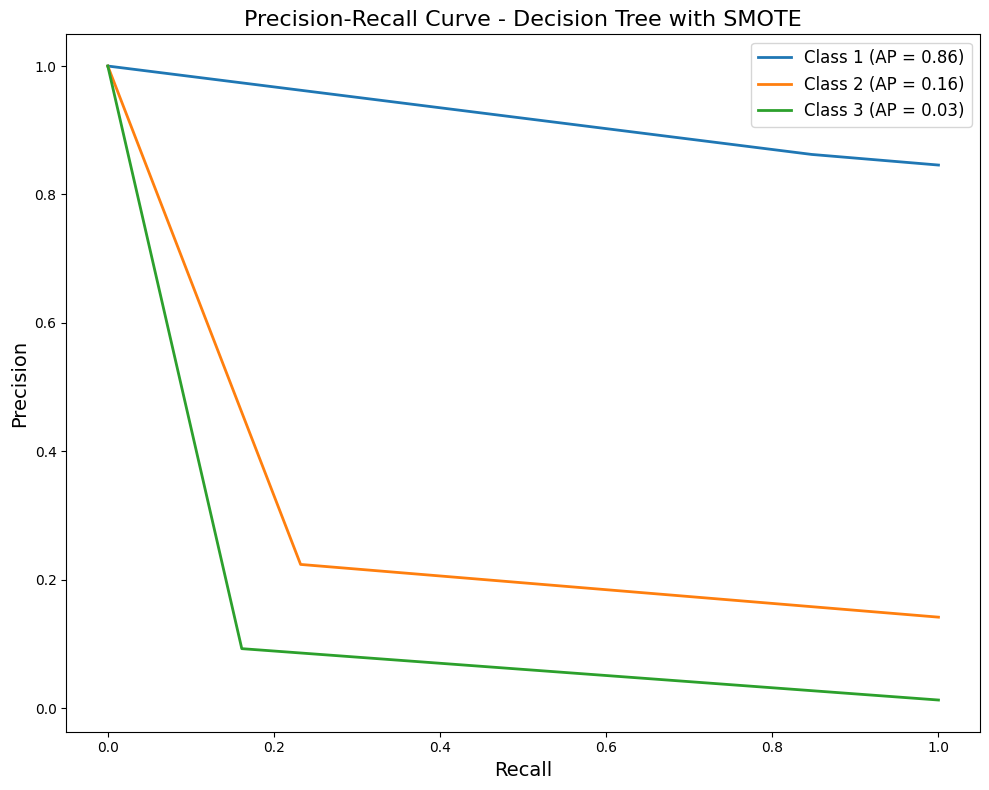

In [ ]:
# Initialize plot
plt.figure(figsize=(10,8))

for i in range(n_classes_dt):
    precision, recall, _ = precision_recall_curve(y_test_binarized_dt[:, i], y_proba_dt[:, i])
    average_precision = average_precision_score(y_test_binarized_dt[:, i], y_proba_dt[:, i])
    plt.plot(recall, precision, lw=2, label='Class {0} (AP = {1:0.2f})'.format(i+1, average_precision))

plt.xlabel('Recall', fontsize=14)
plt.ylabel('Precision', fontsize=14)
plt.title('Precision-Recall Curve - Decision Tree with SMOTE', fontsize=16)
plt.legend(loc="upper right", fontsize=12)
plt.tight_layout()
plt.savefig('Precision_Recall_Curve_DT_SMOTE.png')
plt.show()


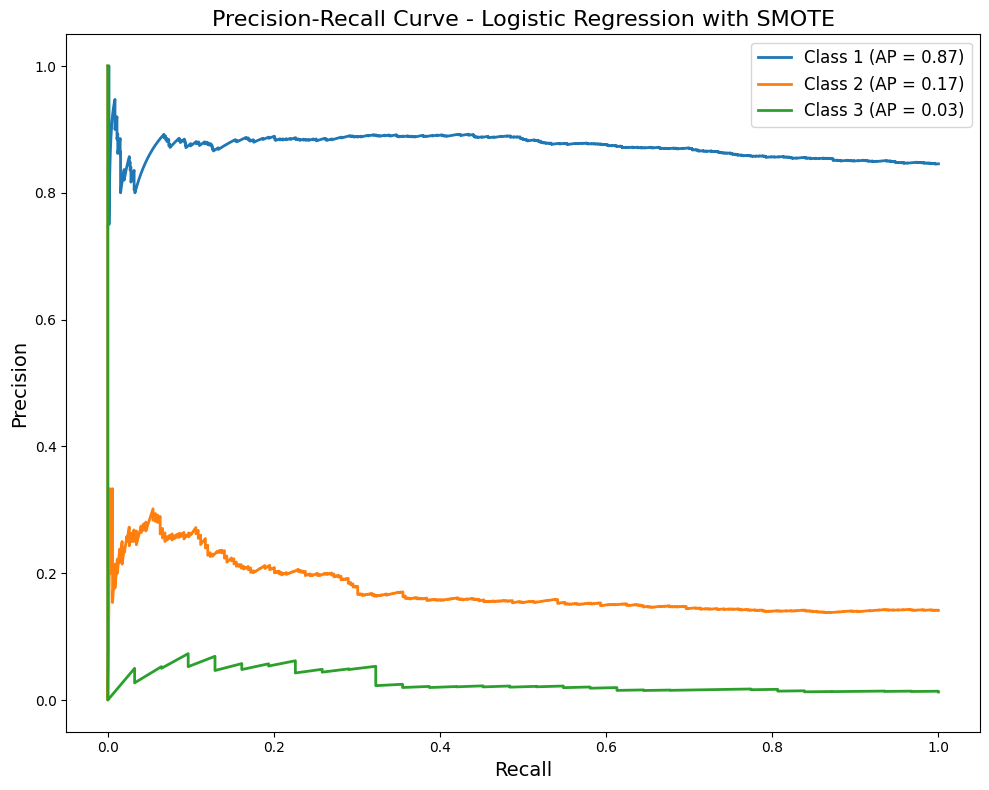

In [ ]:
# Initialize plot
plt.figure(figsize=(10,8))

for i in range(n_classes_lr):
    precision, recall, _ = precision_recall_curve(y_test_binarized_lr[:, i], y_proba_lr[:, i])
    average_precision = average_precision_score(y_test_binarized_lr[:, i], y_proba_lr[:, i])
    plt.plot(recall, precision, lw=2, label='Class {0} (AP = {1:0.2f})'.format(i+1, average_precision))

plt.xlabel('Recall', fontsize=14)
plt.ylabel('Precision', fontsize=14)
plt.title('Precision-Recall Curve - Logistic Regression with SMOTE', fontsize=16)
plt.legend(loc="upper right", fontsize=12)
plt.tight_layout()
plt.savefig('Precision_Recall_Curve_LR_SMOTE.png')
plt.show()


In [ ]:
# Cohen's Kappa for Decision Tree
kappa_dt = cohen_kappa_score(y_test, y_pred_dt)
print("\nCohen's Kappa (Decision Tree with SMOTE):", kappa_dt)



Cohen's Kappa (Decision Tree with SMOTE): 0.09985602166121876


In [ ]:
# Cohen's Kappa for Logistic Regression
kappa_lr = cohen_kappa_score(y_test, y_pred_lr)
print("Cohen's Kappa (Logistic Regression with SMOTE):", kappa_lr)


Cohen's Kappa (Logistic Regression with SMOTE): 0.05625707609664443


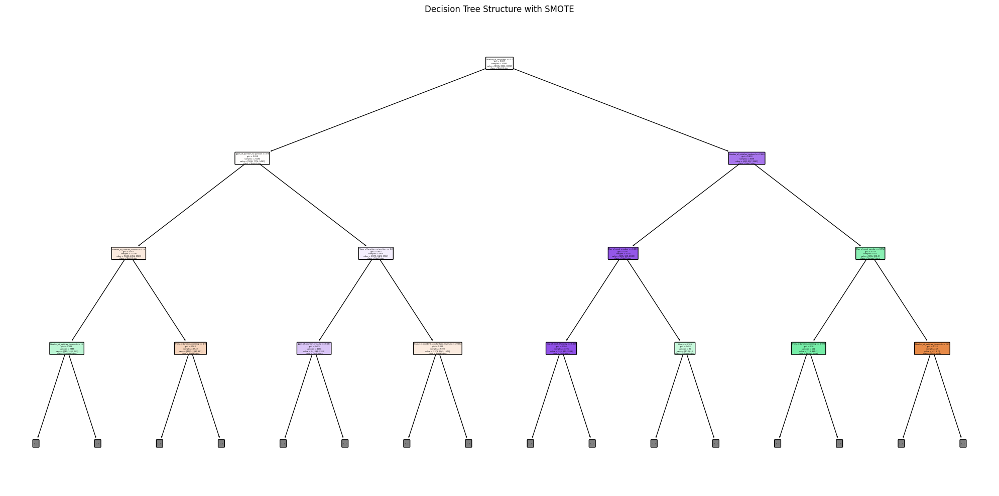

In [ ]:
# Extract the trained Decision Tree classifier
dt_model = pipeline_dt_smote.named_steps['classifier']

# Define feature names and class names
feature_names = X.columns
class_names = ['Slight Injury', 'Serious Injury', 'Fatal Injury']  # Adjust as per your data

# Plot the tree (limit depth for readability)
plt.figure(figsize=(20,10))
plot_tree(
    dt_model,
    feature_names=feature_names,
    class_names=class_names,
    filled=True,
    rounded=True,
    max_depth=3  # Adjust based on complexity
)
plt.title('Decision Tree Structure with SMOTE')
plt.tight_layout()
plt.savefig('Decision_Tree_Structure_SMOTE.png')
plt.show()


In [ ]:
NOW TRYING A RANDOM FOREST FOR COMPARISON

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# For modeling
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize

# For handling class imbalance
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

# For saving models
import joblib

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')


In [ ]:
# Define feature matrix X and target vector y
# Assuming 'Accident_severity' is your target variable
X = final_df.drop('Accident_severity', axis=1)
y = final_df['Accident_severity']

print("\nFeature Matrix Shape:", X.shape)
print("Target Vector Shape:", y.shape)



Feature Matrix Shape: (12316, 154)
Target Vector Shape: (12316,)


In [ ]:
from sklearn.model_selection import train_test_split

# Split the data (80% training, 20% testing) with stratification
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print("\nTraining Set Shape:", X_train.shape, y_train.shape)
print("Testing Set Shape:", X_test.shape, y_test.shape)



Training Set Shape: (9852, 154) (9852,)
Testing Set Shape: (2464, 154) (2464,)


In [ ]:
# Initialize SMOTE
smote = SMOTE(random_state=42)

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(
    n_estimators=100,       # Number of trees in the forest
    max_depth=None,         # Maximum depth of the tree
    random_state=42,
    class_weight='balanced' # To handle class imbalance
)

# Create a pipeline with SMOTE and Random Forest
pipeline_rf_smote = Pipeline([
    ('smote', smote),
    ('classifier', rf_classifier)
])

# Train the pipeline
pipeline_rf_smote.fit(X_train, y_train)

print("\nRandom Forest with SMOTE has been trained.")



Random Forest with SMOTE has been trained.


In [ ]:
# Make predictions
y_pred_rf = pipeline_rf_smote.predict(X_test)
y_proba_rf = pipeline_rf_smote.predict_proba(X_test)


In [ ]:
# Classification Report for Random Forest
print("\nRandom Forest with SMOTE - Classification Report:")
print(classification_report(y_test, y_pred_rf))



Random Forest with SMOTE - Classification Report:
              precision    recall  f1-score   support

           1       0.85      1.00      0.92      2084
           2       0.60      0.01      0.02       349
           3       0.00      0.00      0.00        31

    accuracy                           0.85      2464
   macro avg       0.48      0.34      0.31      2464
weighted avg       0.80      0.85      0.78      2464



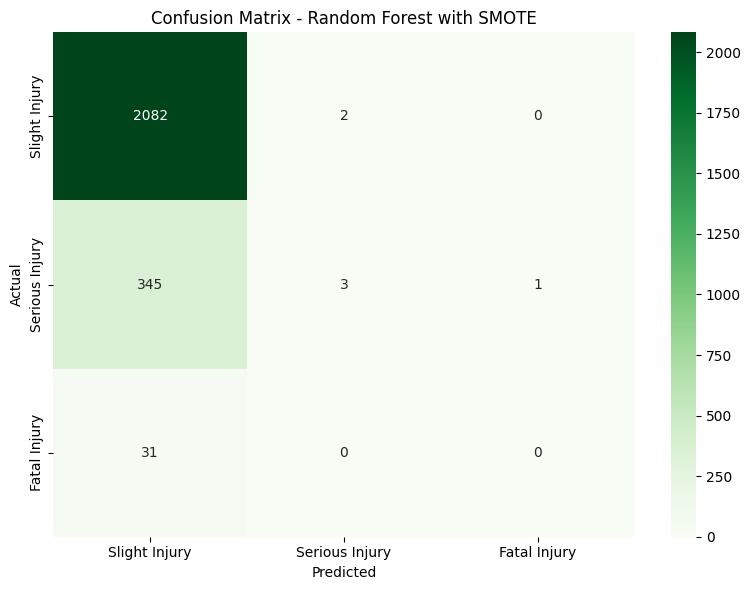

In [ ]:
# Confusion Matrix for Random Forest
cm_rf = confusion_matrix(y_test, y_pred_rf)

plt.figure(figsize=(8,6))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Greens',
            xticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
            yticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Random Forest with SMOTE')
plt.tight_layout()
plt.savefig('Confusion_Matrix_RF_SMOTE.png')
plt.show()


USING AN AGRESSIVE SMOTE TO TRY AND CATCH THE SMALL CLASSES

In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# For modeling
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report, confusion_matrix, f1_score, recall_score, precision_score,
    roc_curve, auc, cohen_kappa_score
)
from sklearn.preprocessing import label_binarize
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
import joblib

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')


In [ ]:

smote_aggressive = SMOTE(sampling_strategy='auto', random_state=42)

# Display original class distribution
print("\nOriginal Class Distribution:")
print(y_train.value_counts())

# Apply SMOTE
X_train_smote, y_train_smote = smote_aggressive.fit_resample(X_train, y_train)

# Display new class distribution
print("\nClass Distribution after Aggressive SMOTE:")
print(pd.Series(y_train_smote).value_counts())



Original Class Distribution:
Accident_severity
1    8331
2    1394
3     127
Name: count, dtype: int64

Class Distribution after Aggressive SMOTE:
Accident_severity
1    8331
2    8331
3    8331
Name: count, dtype: int64


In [ ]:
# Initialize the Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(
    max_depth=None,
    random_state=42,
    class_weight=None  # Already handled by SMOTE
)

# Train the Decision Tree
dt_classifier.fit(X_train_smote, y_train_smote)

print("\nDecision Tree has been trained on Aggressively SMOTE-resampled data.")



Decision Tree has been trained on Aggressively SMOTE-resampled data.


In [ ]:
# Initialize the Logistic Regression model
log_reg = LogisticRegression(
    max_iter=1000,
    random_state=42,
    class_weight=None,  # Already handled by SMOTE
    multi_class='multinomial',
    solver='lbfgs'
)

# Train the Logistic Regression model
log_reg.fit(X_train_smote, y_train_smote)

print("Logistic Regression has been trained on Aggressively SMOTE-resampled data.")


Logistic Regression has been trained on Aggressively SMOTE-resampled data.


In [ ]:
# Decision Tree Predictions
y_pred_dt = dt_classifier.predict(X_test)
y_proba_dt = dt_classifier.predict_proba(X_test)

# Logistic Regression Predictions
y_pred_lr = log_reg.predict(X_test)
y_proba_lr = log_reg.predict_proba(X_test)


In [ ]:

print("\nDecision Tree - Classification Report:")
print(classification_report(y_test, y_pred_dt, target_names=['Slight Injury', 'Serious Injury', 'Fatal Injury']))

print("\nLogistic Regression - Classification Report:")
print(classification_report(y_test, y_pred_lr, target_names=['Slight Injury', 'Serious Injury', 'Fatal Injury']))



Decision Tree - Classification Report:
                precision    recall  f1-score   support

 Slight Injury       0.87      0.84      0.86      2084
Serious Injury       0.24      0.28      0.26       349
  Fatal Injury       0.15      0.23      0.18        31

      accuracy                           0.75      2464
     macro avg       0.42      0.45      0.43      2464
  weighted avg       0.77      0.75      0.76      2464


Logistic Regression - Classification Report:
                precision    recall  f1-score   support

 Slight Injury       0.88      0.50      0.64      2084
Serious Injury       0.18      0.42      0.25       349
  Fatal Injury       0.03      0.39      0.05        31

      accuracy                           0.49      2464
     macro avg       0.36      0.44      0.31      2464
  weighted avg       0.77      0.49      0.58      2464



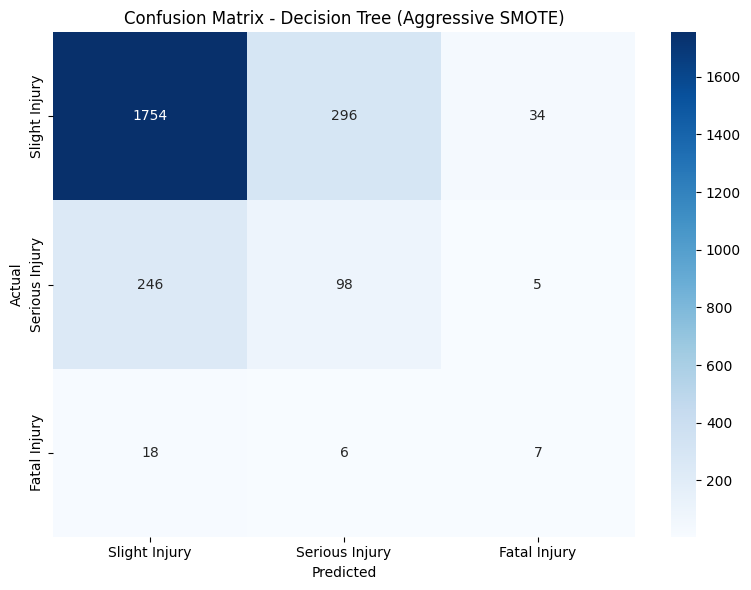

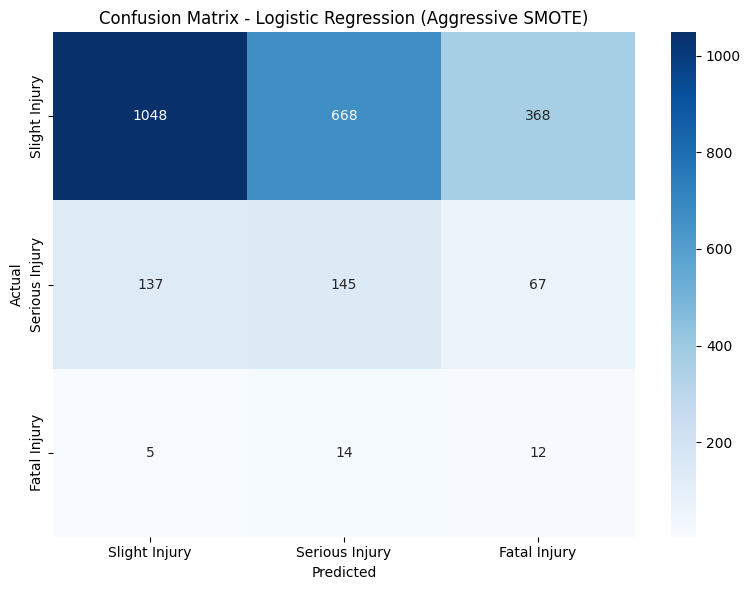

In [ ]:

def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
                yticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model_name} (Aggressive SMOTE)')
    plt.tight_layout()
    plt.show()

# Plot Confusion Matrices
plot_confusion_matrix(y_test, y_pred_dt, "Decision Tree")
plot_confusion_matrix(y_test, y_pred_lr, "Logistic Regression")


In [ ]:
from sklearn.metrics import cohen_kappa_score


def print_kappa(y_true, y_pred, model_name):
    kappa = cohen_kappa_score(y_true, y_pred)
    print(f"\nCohen's Kappa ({model_name}): {kappa:.2f}")

# Print Cohen's Kappa
print_kappa(y_test, y_pred_dt, "Decision Tree")
print_kappa(y_test, y_pred_lr, "Logistic Regression")



Cohen's Kappa (Decision Tree): 0.14

Cohen's Kappa (Logistic Regression): 0.06



Random Forest - Classification Report:
                precision    recall  f1-score   support

 Slight Injury       0.85      1.00      0.92      2084
Serious Injury       0.75      0.01      0.02       349
  Fatal Injury       0.00      0.00      0.00        31

      accuracy                           0.85      2464
     macro avg       0.53      0.34      0.31      2464
  weighted avg       0.82      0.85      0.78      2464



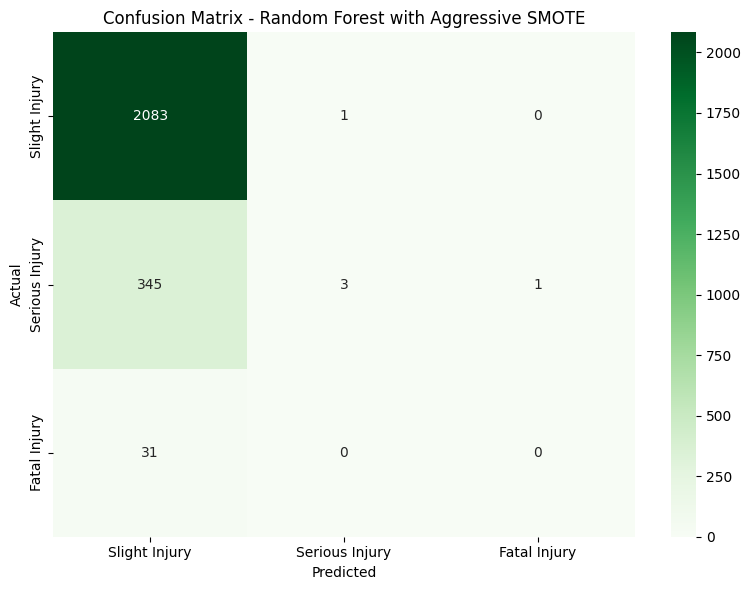

F1-Score for Class 1 (Slight Injury): 0.92
F1-Score for Class 2 (Serious Injury): 0.02
F1-Score for Class 3 (Fatal Injury): 0.00

Cohen's Kappa (Random Forest): 0.01


In [ ]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, f1_score, cohen_kappa_score
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline


# Define feature matrix X and target vector y
X = final_df.drop('Accident_severity', axis=1)
y = final_df['Accident_severity']

# Split the data with stratification
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Initialize Aggressive SMOTE
smote_aggressive = SMOTE(sampling_strategy='auto', random_state=42)

# Apply SMOTE
X_train_smote, y_train_smote = smote_aggressive.fit_resample(X_train, y_train)

# Initialize Random Forest
rf_classifier = RandomForestClassifier(
    n_estimators=200,       # Increased number of trees for better performance
    max_depth=None,
    random_state=42,
    class_weight=None       # Already handled by SMOTE
)

# Train the Random Forest
rf_classifier.fit(X_train_smote, y_train_smote)

# Make predictions
y_pred_rf = rf_classifier.predict(X_test)
y_proba_rf = rf_classifier.predict_proba(X_test)

# Classification Report
print("\nRandom Forest - Classification Report:")
print(classification_report(y_test, y_pred_rf, target_names=['Slight Injury', 'Serious Injury', 'Fatal Injury']))

# Confusion Matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(8,6))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Greens',
            xticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
            yticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Random Forest with Aggressive SMOTE')
plt.tight_layout()
plt.show()

# F1-Scores
f1_rf = f1_score(y_test, y_pred_rf, average=None)
for i, score in enumerate(f1_rf, 1):
    print(f"F1-Score for Class {i} ({'Slight Injury' if i==1 else 'Serious Injury' if i==2 else 'Fatal Injury'}): {score:.2f}")

# Cohen's Kappa
kappa_rf = cohen_kappa_score(y_test, y_pred_rf)
print(f"\nCohen's Kappa (Random Forest): {kappa_rf:.2f}")



Gradient Boosting - Classification Report:
                precision    recall  f1-score   support

 Slight Injury       0.85      0.99      0.92      2084
Serious Injury       0.55      0.08      0.14       349
  Fatal Injury       0.75      0.10      0.17        31

      accuracy                           0.85      2464
     macro avg       0.72      0.39      0.41      2464
  weighted avg       0.81      0.85      0.80      2464



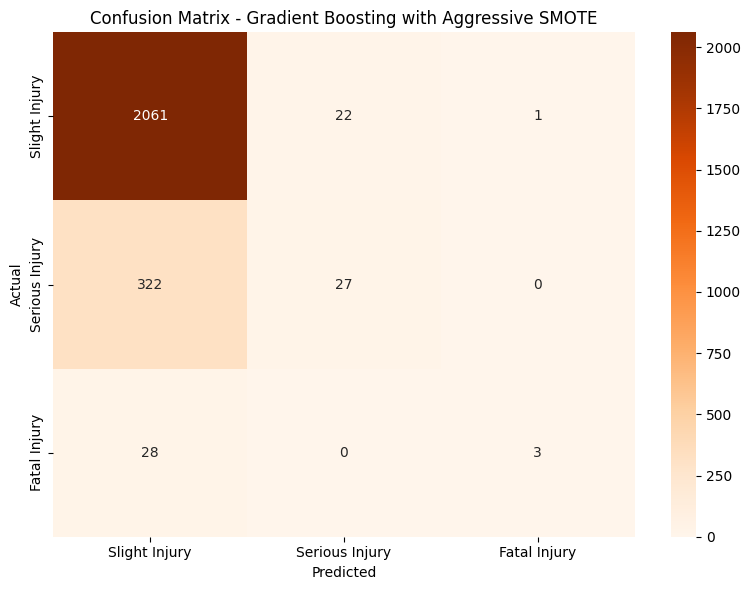

F1-Score for Class 1 (Slight Injury): 0.92
F1-Score for Class 2 (Serious Injury): 0.14
F1-Score for Class 3 (Fatal Injury): 0.17

Cohen's Kappa (Gradient Boosting): 0.11


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize Gradient Boosting Classifier
gbm_classifier = GradientBoostingClassifier(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=5,
    random_state=42
)

# Train the Gradient Boosting model
gbm_classifier.fit(X_train_smote, y_train_smote)

# Make predictions
y_pred_gbm = gbm_classifier.predict(X_test)
y_proba_gbm = gbm_classifier.predict_proba(X_test)

# Classification Report
print("\nGradient Boosting - Classification Report:")
print(classification_report(y_test, y_pred_gbm, target_names=['Slight Injury', 'Serious Injury', 'Fatal Injury']))

# Confusion Matrix
cm_gbm = confusion_matrix(y_test, y_pred_gbm)
plt.figure(figsize=(8,6))
sns.heatmap(cm_gbm, annot=True, fmt='d', cmap='Oranges',
            xticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
            yticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Gradient Boosting with Aggressive SMOTE')
plt.tight_layout()
plt.show()

# F1-Scores
f1_gbm = f1_score(y_test, y_pred_gbm, average=None)
for i, score in enumerate(f1_gbm, 1):
    print(f"F1-Score for Class {i} ({'Slight Injury' if i==1 else 'Serious Injury' if i==2 else 'Fatal Injury'}): {score:.2f}")

# Cohen's Kappa
kappa_gbm = cohen_kappa_score(y_test, y_pred_gbm)
print(f"\nCohen's Kappa (Gradient Boosting): {kappa_gbm:.2f}")



Balanced Random Forest - Classification Report:
                precision    recall  f1-score   support

 Slight Injury       0.88      0.52      0.65      2084
Serious Injury       0.21      0.40      0.27       349
  Fatal Injury       0.03      0.55      0.06        31

      accuracy                           0.50      2464
     macro avg       0.37      0.49      0.33      2464
  weighted avg       0.77      0.50      0.59      2464



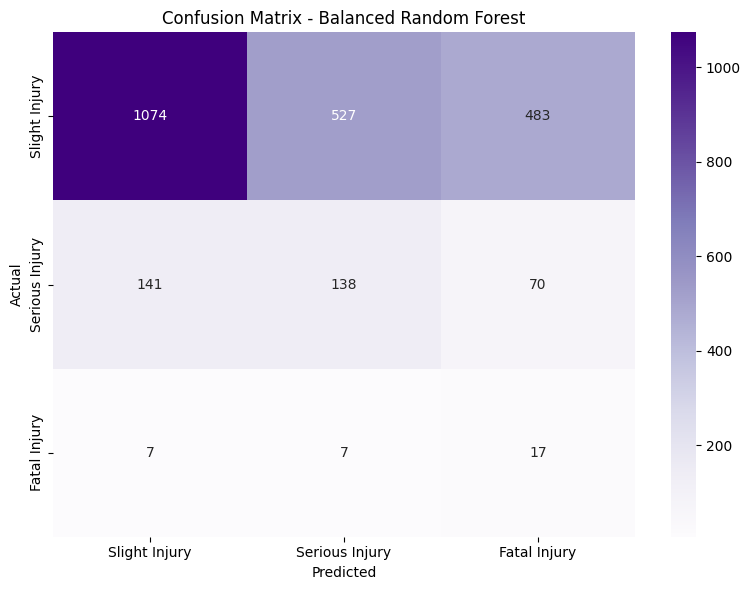

F1-Score for Class 1 (Slight Injury): 0.65
F1-Score for Class 2 (Serious Injury): 0.27
F1-Score for Class 3 (Fatal Injury): 0.06

Cohen's Kappa (Balanced Random Forest): 0.07


In [ ]:
from imblearn.ensemble import BalancedRandomForestClassifier

# Initialize Balanced Random Forest
brf_classifier = BalancedRandomForestClassifier(
    n_estimators=200,
    max_depth=None,
    random_state=42
)

# Train the Balanced Random Forest
brf_classifier.fit(X_train, y_train)  # Note: No need to apply SMOTE here

# Make predictions
y_pred_brf = brf_classifier.predict(X_test)
y_proba_brf = brf_classifier.predict_proba(X_test)

# Classification Report
print("\nBalanced Random Forest - Classification Report:")
print(classification_report(y_test, y_pred_brf, target_names=['Slight Injury', 'Serious Injury', 'Fatal Injury']))

# Confusion Matrix
cm_brf = confusion_matrix(y_test, y_pred_brf)
plt.figure(figsize=(8,6))
sns.heatmap(cm_brf, annot=True, fmt='d', cmap='Purples',
            xticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
            yticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Balanced Random Forest')
plt.tight_layout()
plt.show()

# F1-Scores
f1_brf = f1_score(y_test, y_pred_brf, average=None)
for i, score in enumerate(f1_brf, 1):
    print(f"F1-Score for Class {i} ({'Slight Injury' if i==1 else 'Serious Injury' if i==2 else 'Fatal Injury'}): {score:.2f}")

# Cohen's Kappa
kappa_brf = cohen_kappa_score(y_test, y_pred_brf)
print(f"\nCohen's Kappa (Balanced Random Forest): {kappa_brf:.2f}")


In [ ]:
pip install xgboost


Note: you may need to restart the kernel to use updated packages.



Stacking Classifier - Classification Report:
                precision    recall  f1-score   support

 Slight Injury       0.85      0.97      0.91      2084
Serious Injury       0.27      0.06      0.10       349
  Fatal Injury       0.67      0.06      0.12        31

      accuracy                           0.83      2464
     macro avg       0.59      0.37      0.37      2464
  weighted avg       0.77      0.83      0.78      2464



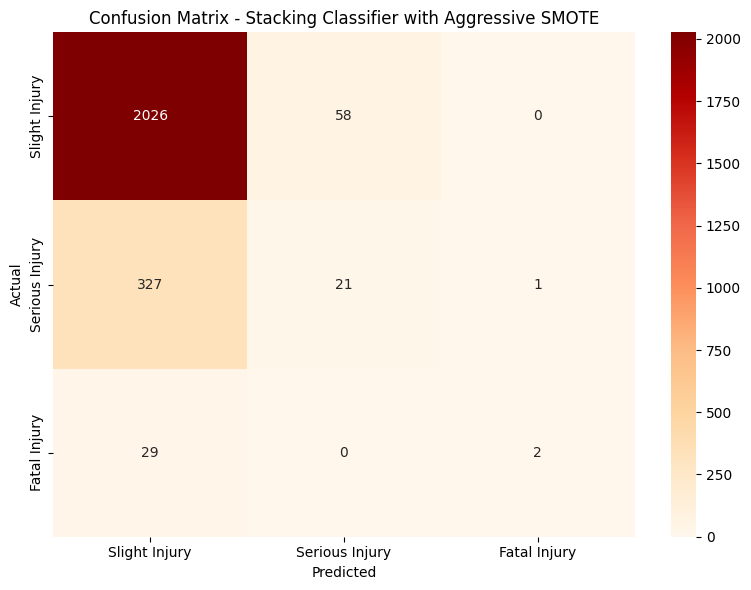

F1-Score for Class 1 (Slight Injury): 0.91
F1-Score for Class 2 (Serious Injury): 0.10
F1-Score for Class 3 (Fatal Injury): 0.12

Cohen's Kappa (Stacking Classifier): 0.05


In [ ]:
from sklearn.ensemble import StackingClassifier

# Define base learners
base_learners = [
    ('dt', DecisionTreeClassifier(max_depth=10, random_state=42)),
    ('lr', LogisticRegression(max_iter=1000, random_state=42)),
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42))
]

# Define meta-learner
meta_learner = GradientBoostingClassifier(n_estimators=100, random_state=42)

# Initialize Stacking Classifier
stacking_clf = StackingClassifier(
    estimators=base_learners,
    final_estimator=meta_learner,
    cv=5,
    stack_method='auto',
    passthrough=False
)

# Train the Stacking Classifier with Aggressive SMOTE
stacking_clf.fit(X_train_smote, y_train_smote)

# Make predictions
y_pred_stack = stacking_clf.predict(X_test)
y_proba_stack = stacking_clf.predict_proba(X_test)

# Classification Report
print("\nStacking Classifier - Classification Report:")
print(classification_report(y_test, y_pred_stack, target_names=['Slight Injury', 'Serious Injury', 'Fatal Injury']))

# Confusion Matrix
cm_stack = confusion_matrix(y_test, y_pred_stack)
plt.figure(figsize=(8,6))
sns.heatmap(cm_stack, annot=True, fmt='d', cmap='OrRd',
            xticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
            yticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Stacking Classifier with Aggressive SMOTE')
plt.tight_layout()
plt.show()

# F1-Scores
f1_stack = f1_score(y_test, y_pred_stack, average=None)
for i, score in enumerate(f1_stack, 1):
    print(f"F1-Score for Class {i} ({'Slight Injury' if i==1 else 'Serious Injury' if i==2 else 'Fatal Injury'}): {score:.2f}")

# Cohen's Kappa
kappa_stack = cohen_kappa_score(y_test, y_pred_stack)
print(f"\nCohen's Kappa (Stacking Classifier): {kappa_stack:.2f}")



Voting Classifier - Classification Report:
                precision    recall  f1-score   support

 Slight Injury       0.86      0.98      0.91      2084
Serious Injury       0.49      0.08      0.14       349
  Fatal Injury       0.23      0.23      0.23        31

      accuracy                           0.84      2464
     macro avg       0.53      0.43      0.43      2464
  weighted avg       0.80      0.84      0.79      2464



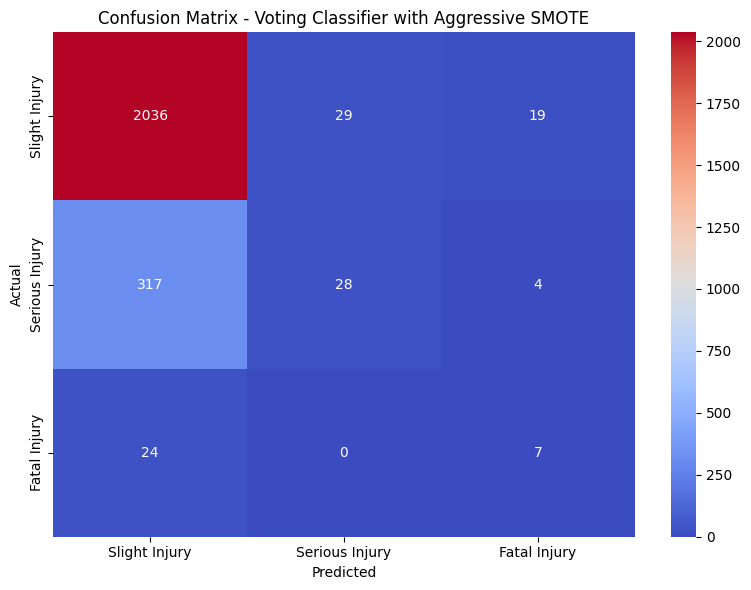

F1-Score for Class 1 (Slight Injury): 0.91
F1-Score for Class 2 (Serious Injury): 0.14
F1-Score for Class 3 (Fatal Injury): 0.23

Cohen's Kappa (Voting Classifier): 0.12


In [ ]:
from sklearn.ensemble import VotingClassifier

# Define individual models
dt = DecisionTreeClassifier(max_depth=10, random_state=42)
rf = RandomForestClassifier(n_estimators=200, max_depth=10, random_state=42)
gbm = GradientBoostingClassifier(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42)

# Initialize Voting Classifier with soft voting
voting_clf = VotingClassifier(
    estimators=[
        ('dt', dt),
        ('rf', rf),
        ('gbm', gbm)
    ],
    voting='soft'  # Use 'hard' for majority voting
)

# Train Voting Classifier on SMOTE-resampled data
voting_clf.fit(X_train_smote, y_train_smote)

# Make predictions
y_pred_voting = voting_clf.predict(X_test)
y_proba_voting = voting_clf.predict_proba(X_test)

# Classification Report
print("\nVoting Classifier - Classification Report:")
print(classification_report(y_test, y_pred_voting, target_names=['Slight Injury', 'Serious Injury', 'Fatal Injury']))

# Confusion Matrix
cm_voting = confusion_matrix(y_test, y_pred_voting)
plt.figure(figsize=(8,6))
sns.heatmap(cm_voting, annot=True, fmt='d', cmap='coolwarm',
            xticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'],
            yticklabels=['Slight Injury', 'Serious Injury', 'Fatal Injury'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Voting Classifier with Aggressive SMOTE')
plt.tight_layout()
plt.show()

# F1-Scores
f1_voting = f1_score(y_test, y_pred_voting, average=None)
for i, score in enumerate(f1_voting, 1):
    print(f"F1-Score for Class {i} ({'Slight Injury' if i==1 else 'Serious Injury' if i==2 else 'Fatal Injury'}): {score:.2f}")

# Cohen's Kappa
kappa_voting = cohen_kappa_score(y_test, y_pred_voting)
print(f"\nCohen's Kappa (Voting Classifier): {kappa_voting:.2f}")
